# Bayesian Optimization



*   Andrea Peri
*   Marija Mojsovska
*   Filippo Festa
*   Filippo Orlando



In [ ]:
import numpy as np
from numpy.linalg import inv, det, pinv
from scipy.optimize import minimize, direct
from random import uniform, randrange
from math import erf
from time import time
from itertools import product
from pandas import DataFrame
from copy import deepcopy

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import plotly.graph_objects as go
from matplotlib.lines import Line2D
from plotly.subplots import make_subplots

from sklearn import svm
from sklearn.model_selection import GridSearchCV, PredefinedSplit
from sklearn.neural_network import MLPClassifier

## Analytic objectives functions

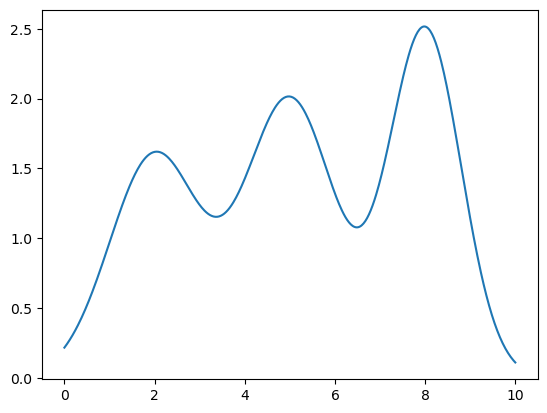

In [ ]:
def gaussian(x, mu, sig, A):
  return A/(np.sqrt(2*np.pi)*sig)*np.exp(-(x - mu)**2/(2*sig**2))

def multiple_gauss(x):
  return gaussian(x,2,1,4)+gaussian(x,5,1,5)+gaussian(x,8,0.8,5)

x = np.linspace(0,10,500)
y = multiple_gauss(x)
plt.plot(x,y)

In [ ]:
def branin(x):
  a, b, c, r, s, t = 1, 5.1/(4*np.pi**2), 5/np.pi, 6, 10, 1/(8*np.pi)
  return -(a*(x[1] - b*x[0]**2 + c*x[0] - r)**2 + s*(1-t)*np.cos(x[0]) + s + 5*x[0]) + 300

Locator attempting to generate 3000 ticks ([16.8, ..., 316.70000000000005]), which exceeds Locator.MAXTICKS (1000).


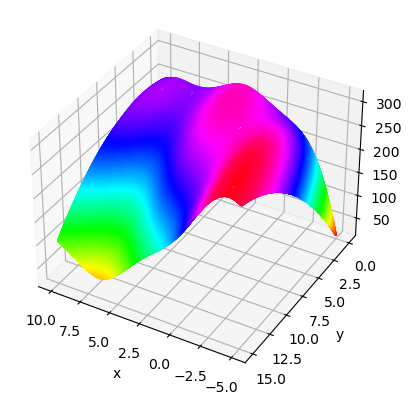

In [ ]:
x = np.linspace(-5, 10, 100)
y = np.linspace(0, 15, 100)
X = np.meshgrid(x, y)
Z = branin(X)

fig = plt.figure()
ax = plt.axes(projection='3d')
ax.contour3D(X[0], X[1], Z, 3000, cmap='hsv')

ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z')

ax.view_init(35, 120)

## Kernel and acquisition functions

In [ ]:
# define kernel
def matern5(x, y, theta0, thetai, idx=[], idx_cat=[]):
  x = [round(val) if i in idx else val for i, val in enumerate(x)]                       # round to integer
  y = [round(val) if i in idx else val for i, val in enumerate(y)]

  for sublist in idx_cat:                                                                # "round" to categorical
    max_value = max(x[i] for i in sublist)
    for i in sublist:
      x[i] = 1 if x[i] == max_value else 0

  r2 = 0.
  for i in range(len(x)):
    r2 += thetai[i]*(x[i]-y[i])**2
  return theta0*np.exp(-np.sqrt(5*r2))*(1+np.sqrt(5*r2)+5/3*r2)

# define the kernel derivative
def der_matern5(x, y, theta0, thetai, idx=[], idx_cat=[]):
  x = [round(val) if i in idx else val for i, val in enumerate(x)]                       # round to integer
  y = [round(val) if i in idx else val for i, val in enumerate(y)]

  for sublist in idx_cat:                                                                # "round" to categorical
    max_value = max(x[i] for i in sublist)
    for i in sublist:
      x[i] = 1 if x[i] == max_value else 0

  r2 = 0.
  for i in range(len(x)):
    r2 += thetai[i]*(x[i]-y[i])**2

  if r2==0:
    return 0.
  else:
    der_r2 = np.zeros(len(x))
    for i in range(len(x)):
      if i not in np.append(idx,idx_cat):
        der_r2[i] = 2*thetai[i]*(x[i]-y[i])

    der_r = 1/(2*np.sqrt(r2))*der_r2

    return np.array(theta0*(-np.sqrt(5)*np.exp(-np.sqrt(5*r2))*(1+np.sqrt(5*r2)+5/3*r2) + np.exp(-np.sqrt(5*r2))*(np.sqrt(5)+10/3*np.sqrt(r2)))*der_r)

In [ ]:
# define the PI acquisition function and its gradient
def PI_func_and_der(x, xt, ft, kernel, theta0, thetai, eps, K1, A, mu_max, idx=[], idx_cat=[], print_sigma=True, calc_der=True, sampling_plot=False):
  # comment on flags:
  # - print_sigma: if True, it will be printed a message in the case of negative sigma^2
  # - calc_der: if True, this fuction return also the acquisition function derivative. If False, only the acquisition function value will be returned.
  # - sampling_plot: if True, this function return only the parameters of the GP.

  # compute the parameters of the gaussian process
  kT = np.array([kernel(x,xt[i],theta0,thetai,idx,idx_cat) for i in range(len(xt))])          # list of covariances between new (proposal) and already sampled points
  mu = np.dot(kT,A)                                                                           # mean function of the gaussian process
  sig2 = kernel(x,x,theta0,thetai,idx,idx_cat) - np.dot(kT,np.dot(K1,kT))                     # variance of the gaussian process

  # for some choice of the GP parameters, it may result a negative-sigma. We make a hard choice and set it to 0 if this happens.
  if sig2 >= 0:
    sig = np.sqrt(sig2)
  elif print_sigma:
    print(sig2)
    sig = 0
  else:
    sig = 0

  if sig == 0:                                                                                # in the case sig=0, return appropriate values
    if calc_der:
      return (0., np.zeros(len(x)))
    elif sampling_plot:
      return mu, sig, 0
    else:
      return 0

  else:                                                                                       # in the case sig != 0 :
    # compute the acquisition function
    Z = (mu - mu_max - eps)/sig
    cdf = 0.5*(1+erf(Z/np.sqrt(2)))
    PI = - cdf                                                                                # acquisition function value

    # compute derivatives if needed
    if calc_der:
      der_kernel_vals = np.zeros(xt.shape)
      for i in range(len(ft)):
        der_kernel_vals[0] = der_matern5(x,xt[i],theta0,thetai,idx,idx_cat)
      der_mu = np.zeros(len(x))
      der_sig2 = np.zeros(len(x))
      for i in range(len(ft)):
        der_mu += A[i]*der_kernel_vals[i]
        for j in range(len(ft)):
          der_sig2 -= K1[i,j]*(der_kernel_vals[i]*kT[j] + kT[i]*der_kernel_vals[j])
      der_sig = 1/(2*sig)*der_sig2

      der_Z = (der_mu*sig - (mu-mu_max-eps)*der_sig)/(sig**2)                                 # compute the acquisition function gradient
      der_cdf = 1/np.sqrt(2*np.pi)*np.exp(-Z**2/2)
      der_PI = - der_cdf * der_Z
      return (PI, der_PI)

    elif sampling_plot:
      return mu, sig, PI

    else:
      return PI

In [ ]:
# define the EI acquisition function and its gradient
def EI_func_and_der(x, xt, ft, kernel, theta0, thetai, eps, K1, A, mu_max, idx=[], idx_cat=[], print_sigma=True, calc_der=True, sampling_plot=False):
  # comment on flags:
  # - print_sigma: if True, it will be printed a message in the case of negative sigma^2
  # - calc_der: if True, this fuction return also the acquisition function derivative. If False, only the acquisition function value will be returned.
  # - sampling_plot: if True, this function return only the parameters of the GP.

  # compute the parameters of the gaussian process
  kT = np.array([kernel(x,xt[i],theta0,thetai,idx,idx_cat) for i in range(len(xt))])          # list of covariances between new (proposal) and already sampled points
  mu = np.dot(kT,A)                                                                           # mean function of the gaussian process
  sig2 = kernel(x,x,theta0,thetai,idx,idx_cat) - np.dot(kT,np.dot(K1,kT))                     # variance of the gaussian process

  # for some unusual choice of the GP parameters, it may result a negative-sigma. We make a hard choice and set it to 0 if this happens.
  if sig2 >= 0:
    sig = np.sqrt(sig2)
  elif print_sigma:
    print(sig2)
    sig = 0
  else:
    sig = 0

  if sig == 0:                                                                                # in the case sig=0, return appropriate values
    if calc_der:
      return (0., np.zeros(len(x)))
    elif sampling_plot:
      return mu, sig, 0
    else:
      return 0

  else:                                                                                       # in the case sig != 0 :
    # compute the acquisition function
    Z = (mu - mu_max - eps)/sig
    pdf = 1/np.sqrt(2*np.pi)*np.exp(-Z**2/2)
    cdf = 0.5*(1+erf(Z/np.sqrt(2)))
    EI = -((mu - mu_max - eps)*cdf + sig*pdf)                                                 # acquisition function value

    # compute derivatives if needed
    if calc_der:
      der_kernel_vals = np.zeros(xt.shape)                                                    # derivatives of the gaussian process parameters
      for i in range(len(ft)):
        der_kernel_vals[0] = der_matern5(x,xt[i],theta0,thetai,idx,idx_cat)                   # ATTENZIONE -> si fissa il kernel
      der_mu = np.zeros(len(x))
      der_sig2 = np.zeros(len(x))
      for i in range(len(ft)):
        der_mu += A[i]*der_kernel_vals[i]
        for j in range(len(ft)):
          der_sig2 -= K1[i,j]*(der_kernel_vals[i]*kT[j] + kT[i]*der_kernel_vals[j])
      der_sig = 1/(2*sig)*der_sig2

      der_Z = (der_mu*sig - (mu-mu_max-eps)*der_sig)/(sig**2)                                 # compute the acquisition function gradient
      der_pdf = -Z/np.sqrt(2*np.pi)*np.exp(-Z**2/2)
      der_cdf = 1/np.sqrt(2*np.pi)*np.exp(-Z**2/2)
      der_EI = -(der_mu*cdf + (mu-mu_max-eps)*der_cdf*der_Z + der_sig*pdf + sig*der_pdf*der_Z)
      return (EI, der_EI)

    elif sampling_plot:                                                                       # for the gaussian process plot (1D)
      return mu, sig, EI

    else:                                                                                     # for the acquisition plot (2D)
      return EI

In [ ]:
# define the EI acquisition function and its gradient
def GPUCB_func_and_der(x, xt, ft, kernel, theta0, thetai, eps, K1, A, mu_max, idx=[], idx_cat=[], print_sigma=True, calc_der=True, sampling_plot=False):
  # comment on flags:
  # - print_sigma: if True, it will be printed a message in the case of negative sigma^2
  # - calc_der: if True, this fuction return also the acquisition function derivative. If False, only the acquisition function value will be returned.
  # - sampling_plot: if True, this function return only the parameters of the GP.

  kT = np.array([kernel(x,xt[i],theta0,thetai,idx,idx_cat) for i in range(len(xt))])          # list of covariances between new (proposal) and already sampled points
  mu = np.dot(kT,A)                                                                           # mean function of the gaussian process
  sig2 = kernel(x,x,theta0,thetai,idx,idx_cat) - np.dot(kT,np.dot(K1,kT))                     # variance of the gaussian process

  # for some unusual choice of the GP parameters, it may result a negative-sigma. We make a hard choice and set it to 0 if this happens.
  if sig2 >= 0:
    sig = np.sqrt(sig2)
  elif print_sigma:
    print(sig2)
    sig = 0
  else:
    sig = 0

  # compute the acquisition function
  nu, delta = 1, 0.5
  tau_t = 2*np.log((len(xt)+1)**(len(x)/2+2)*np.pi**2/(3*delta))
  GP_UCB = -(mu + np.sqrt(nu*tau_t) * sig)                                                    # acquisition function value

  # compute derivatives if needed
  if calc_der:
    der_kernel_vals = np.zeros(xt.shape)
    for i in range(len(ft)):
      der_kernel_vals[0] = der_matern5(x,xt[i],theta0,thetai,idx,idx_cat)
    der_mu = np.zeros(len(x))
    der_sig2 = np.zeros(len(x))
    for i in range(len(ft)):
      der_mu += A[i]*der_kernel_vals[i]
      for j in range(len(ft)):
        der_sig2 -= K1[i,j]*(der_kernel_vals[i]*kT[j] + kT[i]*der_kernel_vals[j])
    if sig == 0:
      der_sig = 0
    else:
      der_sig = 1/(2*sig)*der_sig2

    der_GP_UCB = -(der_mu + np.sqrt(nu*tau_t) * der_sig)                                      # compute the acquisition function gradient
    return (GP_UCB, der_GP_UCB)

  elif sampling_plot:
    return mu, sig, GP_UCB

  else:
    return GP_UCB

## Bayesian Optimization core functions

In [ ]:
# compute the GP necessary matrices, which are K(if needed), K1 (inverse of K), A, mu_max
def gp_var(xt, ft, kernel, theta0, thetai, var_noise, K, idx, idx_cat, flag_modify_K=True):
  # flag_modify_K = True means we need to create K (iter. 1) or add a row and column to it. In BO, flag always is True. If False, only compute K1,A,mu_max (this is used for plots functions)

  if flag_modify_K:
    if len(xt) <= 1:    # first iteration: create K
      K = np.array([[kernel(xt[i],xt[j],theta0,thetai,idx,idx_cat) for j in range(len(xt))] for i in range(len(xt))])   # kernel matrix
    else:               # later iterations: add row and column to K
      x = xt[-1]
      new = [kernel(xt[i],x,theta0,thetai,idx,idx_cat) for i in range(len(xt))]
      K = np.vstack([K, new[:K.shape[0]]])
      K = np.column_stack([K, new])

  K1 = pinv(K + var_noise*np.eye(len(xt)))                                                       # inverted ( kernel_matrix+noise )
  A = np.dot(K1,ft)
  kT_2nd = K[0,:]                                                                                # search for the maximum mean within the sampled points
  mu_max = np.dot(kT_2nd,A)
  for i in range(1,len(xt)):
    kT_2nd = K[i,:]
    mu_trial = np.dot(kT_2nd,A)
    if mu_trial > mu_max:
      mu_max = mu_trial

  if flag_modify_K:
    return K, K1, A, mu_max

  else:
    return K1, A, mu_max

Maximising with DIRECT is faster when the function is smooth. When working with complex-landscape / high-dimensional functions, mqNm is faster, but it has the disadvantage that we need to tune the number of iterations.

Another advantage of DIRECT is that if performs well when using integer/categorial variables.

In [ ]:
# maximisation of the acquisition function: multistarted hill-climbing quasi-Newton method
def acq_func_max_mqNm(acq_func, xt, ft, kernel, theta0, thetai, eps, N_iter, bounds, K1, A, mu_max, idx, idx_cat, print_sigma):
  x_max, f_max = [], 0
  for i in range(N_iter):

    #select a random starting points
    mins, maxs = zip(*bounds)
    starting_point = np.random.uniform(low=mins, high=maxs, size=(len(xt[0]),))

    # maximise the acquisition function
    obj = minimize(acq_func, starting_point, jac=True, method='L-BFGS-B', bounds=bounds, options={'disp':-1, 'maxcor':1000}, args=(xt:=xt, ft:=ft, kernel:=kernel, theta0:=theta0, thetai:=thetai, eps:=eps, K1:=K1, A:=A, mu_max:=mu_max, idx:=idx, idx_cat:=idx_cat, print_sigma:=print_sigma))
    x_opt, f_opt = obj.x, obj.fun

    # if the new maximisation is higher than the previous ones and the new maximum point satisfy the given bounds, update the maximum found
    if f_opt <= f_max:       # < because the acquisition function is defined to be negative (BFGS is used to minimize such function)
      x_max, f_max = x_opt.reshape((1,len(xt[0]))), f_opt
  return [x_max, f_max]

In [ ]:
# maximisation of the acquisition function: DIRECT method
def acq_func_max_direct(acq_func, xt, ft, kernel, theta0, thetai, eps, bounds, K1, A, mu_max, idx, idx_cat, print_sigma):
  obj = direct(acq_func, bounds, args=(xt:=xt, ft:=ft, kernel:=kernel, theta0:=theta0, thetai:=thetai, eps:=eps, K1:=K1, A:=A, mu_max:=mu_max, idx:=idx, idx_cat:=idx_cat, print_sigma:=print_sigma, calc_der:=False), locally_biased=False)
  x_max, f_max = obj.x, obj.fun
  return [x_max, f_max]

In [ ]:
# likelihood of the gp parameters (note: likelihood = posterior when using a uniform prior)
def likelihood_to_be_max(curr_state, xt, ft, kernel, idx=[], idx_cat=[]):
  match len(curr_state):
    case 2: theta0, var_noise, thetai = curr_state[0], 0, [curr_state[1]]
    case 3: theta0, var_noise, thetai = curr_state[0], curr_state[1], [curr_state[2]]
    case x if x>3: theta0, var_noise, thetai = curr_state[0], curr_state[1], curr_state[2:]

  K = np.array([[kernel(xt[i],xt[j],theta0,thetai,idx,idx_cat) for j in range(len(xt))] for i in range(len(xt))]  + var_noise*np.eye(len(xt))) # kernel matrix
  K1 = pinv(K)
  A = np.dot(K1,ft)

  return -np.exp(-0.5*np.dot(ft,A)-0.5*np.log(det(K))-0.5*len(ft)*np.log(2*np.pi))

In [ ]:
# maximisation of the likelihood: multistarted hill-climbing quasi-Newton method
def likeli_max_mqNm(likelihood, xt, ft, kernel, N_iter, bounds, idx=[], idx_cat=[]):
  theta0_max, var_noise_max, thetai_max, f_max = 0, 0, [], 0

  for i in range(N_iter):
    #select a random starting points
    dim = len(bounds)
    mins, maxs = zip(*bounds)
    starting_point = np.random.uniform(low=mins, high=maxs, size=(dim,))

    # maximise the likelihood
    res = minimize(likelihood_to_be_max, starting_point, method='L-BFGS-B', bounds=bounds, options={'disp':-1, 'maxcor':1000}, args=(xt:=xt, ft:=ft, kernel:=kernel, idx:=idx, idx_cat:=idx_cat))
    match dim:
      case 2: theta0_opt, var_noise_opt, thetai_opt = res.x[0], 0, res.x[1:]
      case x if x>2: theta0_opt, var_noise_opt, thetai_opt = res.x[0], res.x[1], res.x[2:]
    f_opt = res.fun

    if f_opt <= f_max:       # < because the likelihood is defined to be negative (BFGS is used to minimize such function)
      theta0_max, var_noise_max, thetai_max, f_max = theta0_opt, var_noise_opt, thetai_opt, f_opt

  return theta0_max, var_noise_max, thetai_max, -f_max

In [ ]:
# maximisation of the likelihood: DIRECT method
def likeli_max_direct(likelihood, xt, ft, kernel, bounds, idx=[], idx_cat=[]):
  res = direct(likelihood_to_be_max, bounds, args=(xt:=xt, ft:=ft, kernel:=kernel, idx:=idx, idx_cat:=idx_cat), locally_biased=False)
  match len(bounds):
    case 2: theta0_max, var_noise_max, thetai_max, f_max = res.x[0], 0, res.x[1:], res.fun
    case x if x>2:  theta0_max, var_noise_max, thetai_max, f_max = res.x[0], res.x[1], res.x[2:], res.fun
  return theta0_max, var_noise_max, thetai_max, -f_max

Note: when using PI or maximising the likelihood, BO tends to perform exploitation only. It may be useful to increase the value of $\epsilon$

In [ ]:
# define the bayesian optimization algorithm
def bayesian_optimization(obj_func, acq_func, max_acq_method, kernel, N_iter_bo, N_iter_min_max, par_gp, bounds_par, N_iter_likeli=0, max_likeli_method='direct', bounds_par_gp=[], idx=[], idx_cat=[], std_added_noise=0, print_sigma=True, print_gp_par=True, initialization=[]):
  '''
  Parameters:
    - obj_func:   objective function to maximise
    - acq_func:   acquisition function to use (choose among PI_func_and_der, EI_func_and_der, GPUCB_func_and_der)
    - max_acq_method:   method to be used to maximise the acquisition function (choose among 'mqNm', 'direct')
    - kernel:   kernel to use in the definition of the gaussian process (only matern5 available)
    - N_iter_bo:    number of BO iterations to be performed
    - N_iter_min_max:   list with minimum and maximum number of iterations to be performed to maximise the acquisition function (only if max_acq_method=='mqNm')
                          The number of such iterations is scheduled by a logistic function:
                            N_iter_maximisation(iteration_bo) = (N_iter_max-N_iter_min)/(1+e^(-0.3*(current_iteration_bo-N_iter_bo/2))) + N_iter_min
    - par_gp:   list of parameters of the gaussian process to be used. If N_iter_likeli != 0 ( <=> when using the maximisation of the likelihood to determine the
                  optimal gp parameters) only eps has to be passed (as an array). Otherwise (N_iter_likeli==0) this parameter has to be arranged as
                  [theta0, var_noise, thetai, eps]. thetai must be passed as an array of values (one for every dimension of the domain of the objective function)
    - bounds_par: bounds of the domain of the objective function. It has to be a list of tuples (or lists), where each one contains the lower and upper bound for a given
                    dimension of the domain
    - N_iter_likeli:  number of iterations to be used in the maximisation of the likelihood (to determine the optimal gp parameters). It is used only if
                        max_likeli_method=='mqNm'. If N_iter_likeli == 0, the gp parameters have to be passed to the BO algorithm, since no maximisation of the
                        likelihood is involved. To enable the likelihood maximisation procedure (even if the direct method is used) set this parameter to be
                        different from 0
    - max_likeli_method:    method to be used to perform th maximisation of the likelihood (choose among 'mqNm', 'direct')
    - bounds_par_gp:    bounds of the parameters of the gaussian process, to be used for the likelihood maximisation procedure. It has to be a list of tuples (or lists), where
                          each one contains the lower and upper bound for a given gp parameter. The first cell is always dedicated to bounds_theta0. In the case where we want to
                          optimize only theta0 and thetai, the second and following cells are dedicated to bounds_thetai. In the other case, the second cell is dedicated to
                          bounds_var_noise, while the following ones to bounds_thetai. Note that var_noise is fixed to 0 if it is not optimized by the likelihood procedure
    - idx:    list of indexes. Every index indicate in which dimension we have a variable of the objective function which only has integer values
    - idx_cat:  list of indexes. Every index indicate in which dimension we have a variable of the objective function which behaves as a categorical variable. Every cell of
                  idx_cat corresponds to a single categorical variable, and it is an array containing all the indexes associated to that variable
    - std_added_noise:    standard deviation of the noise to be applied to the evaluations of the objective function (gaussian channel)
    - print_sigma:    boolean. If true, negative gp sigma's will be printed when encountered
    - print_gp_par:   boolean. If true, print the optimal gp parameters found after the likelihood maximisation for every BO iteration. Only considered when
                        N_iter_likeli != 0
    - initilization:    initial point where to evaluate the objective function for the first iteration. If if is a void list, the initialization will be set randomly
  '''

  if N_iter_likeli!=0: #max likelihood approach
    eps = par_gp[0]
  else:
    theta0, var_noise, thetai, eps = par_gp

  K, Theta0, Var_noise, Thetai = [], [], [], []                                           # lists of GP values obtained by the likelihood maximisation
  dim = len(bounds_par)

  if initialization == []:
    mins, maxs = zip(*bounds_par)
    xt = np.random.uniform(low=mins, high=maxs, size=(1,dim))
  else:
    xt = np.array(initialization).reshape(1,dim)
  ft = np.array([obj_func(xt[0])])                                                         # first function evaluation in a random point

  for i in range(1,N_iter_bo):                                                             # cycle containing the BO algorithm

    if N_iter_likeli!=0: #max likelihood approach
      match max_likeli_method:
        case 'mqNm': theta0, var_noise, thetai, f_max = likeli_max_mqNm(likelihood_to_be_max, xt, ft, kernel, N_iter_likeli, bounds_par_gp, idx, idx_cat)
        case 'direct': theta0, var_noise, thetai, f_max = likeli_max_direct(likelihood_to_be_max, xt, ft, kernel, bounds_par_gp, idx, idx_cat)
        case other:
          print('No method for likelihood maximisation')
          break

      if print_gp_par:
        print("\ntheta0 = ", theta0)
        print('var_noise = ',var_noise)
        print("thetai = ", thetai)

      Theta0.append(theta0)
      Var_noise.append(var_noise)
      Thetai.append(thetai)
      K = np.array([[kernel(xt[i],xt[j],theta0,thetai, idx, idx_cat) for j in range(len(xt))] for i in range(len(xt))]) # K changes each iteration because theta0 and thetai change
      K1, A, mu_max = gp_var(xt, ft, kernel, theta0, thetai, var_noise, K, idx, idx_cat, flag_modify_K=False)

    else:
      K, K1, A, mu_max = gp_var(xt, ft, kernel, theta0, thetai, var_noise, K, idx, idx_cat)

    match max_acq_method:
      case 'mqNm':
        N_iter_max_eff = round((N_iter_min_max[1]-N_iter_min_max[0])/(1+np.exp(-0.3*(i-N_iter_bo/2))) + N_iter_min_max[0])
        x_max, f_max = acq_func_max_mqNm(acq_func, xt, ft, kernel, theta0, thetai, eps, N_iter_max_eff, bounds_par, K1, A, mu_max, idx, idx_cat, print_sigma)
      case 'direct':
        x_max, f_max = acq_func_max_direct(acq_func, xt, ft, kernel, theta0, thetai, eps, bounds_par, K1, A, mu_max, idx, idx_cat, print_sigma)
      case other:
        print('No method for maximisation of the acquisition function')
        break

    x_max = x_max.reshape(1,dim)

    q = np.random.normal(0,std_added_noise)                                                # add random noise to the samples
    xt = np.append(xt, x_max, 0)                                                           # append new samples to xt and ft
    ft = np.append(ft, obj_func(xt[-1])+q)
    print(f'N_iter = {i} \t Sampled point : {xt[-1]} \t f(x) = {ft[-1]+q:.2f}')

  idx_max = np.argmax(ft)                                                                  # select the final result as the sample with the higher function value

  if N_iter_likeli!=0:
    return xt[idx_max], ft[idx_max], xt, ft, Theta0, Var_noise, Thetai
  else:
    return xt[idx_max], ft[idx_max], xt, ft, K

## Plot functions

In [ ]:
# 1D plot of BO iterations (prints the objective function, the GP and the acquisition function)
def plot_1D(obj_func, xt, ft, acq_func, kernel, bounds_par, par_gp, K=[], Theta0=[], Var_noise=[], Thetai=[], idx=[], idx_cat=[], print_sigma=True):

  if len(K)==0: #max likelihood approach
    eps = par_gp[0]

  else:
    theta0, var_noise, thetai, eps = par_gp

  N_iter = len(xt)

  fig, axes = plt.subplots(int(N_iter/2)+1, 2, figsize=(10, N_iter * 2.5))
  plt.subplots_adjust(wspace = 0.3)
  axes.flat[-1].set_visible(False)                                                  # to remove last plot
  axes.flat[-2].set_visible(False)

  m, n = 0, 0                                                                       #axes indexes
  x = np.linspace(bounds_par[0][0],bounds_par[0][1],500)
  y = obj_func(x)

  for j in range(1,len(xt)):
    xt_plot, ft_plot, x_next = xt[:j], ft[:j], xt[j]

    if len(K)==0: #max likelihood approach
      theta0 = Theta0[j-1]
      var_noise = Var_noise[j-1]
      thetai = Thetai[j-1]
      # K changes each iteration because the GP parameters change
      K_plot = np.array([[kernel(xt_plot[q],xt_plot[p],theta0,thetai, idx, idx_cat) for p in range(len(xt_plot))] for q in range(len(xt_plot))] + var_noise*np.eye(len(xt_plot)))

    else:
      K_plot = K[:j,:j]

    K1, A, mu_max = gp_var(xt_plot, ft_plot, kernel, theta0, thetai, var_noise, K_plot, idx, idx_cat, flag_modify_K=False)
    mu, std, y_acq = [], [], []

    for i in x:
      mu_i, std_i, y_acq_i = acq_func([i], xt_plot, ft_plot, kernel, theta0, thetai, eps, K1, A, mu_max, idx, idx_cat, print_sigma, calc_der=False, sampling_plot=True)

      mu.append(mu_i)
      std.append(std_i)
      y_acq.append(-y_acq_i)

    mu, std, axs = np.array(mu), np.array(std), axes[m][n]

    axs.plot(x, y, c='lime', lw=1.5, label='Objective function')
    axs.plot(xt_plot, ft_plot, marker='X', markersize=8, color='black', linestyle='', label='samples')

    axs.fill_between(x, mu+std, mu-std, alpha=0.1)
    axs.plot(x, mu, 'b-', lw=1.5, label='Surrogate function')
    axs.axvline(x=x_next, c='k', ls='--', lw=1, label="next sample")
    axs.set_ylabel('objective function', loc='top')
    axs.set_ylim(bottom = min(y) - 2.5*(max(y)-min(y)))

    ax2 = axs.twinx()
    ax2.plot(x, y_acq, c='red', lw=1.5, label='Acquisition function')
    ax2.set_ylabel('acquisition function', loc='bottom')
    ax2.set_ylim(top = max(y_acq) + 2*(max(y_acq)-min(y_acq)))

    #Legend
    line1 = Line2D([0], [0], color='lime', lw=1.5, label='Objective function')
    point = Line2D([0], [0], marker='X', markersize=8, linestyle='', c='black', label='samples')
    line2 = Line2D([0], [0], color='blue', lw=1.5, label='Surrogate function')
    line3 = Line2D([0], [0], color='red', lw=1.5, label='Acquisition function')
    line4 = Line2D([0], [0], color='black', ls='--', lw=1, label="next sample")

    first_legend = plt.legend(handles=[line1, line2, point], loc = 'upper left')
    axs = plt.gca().add_artist(first_legend)

    plt.legend(handles=[line3, line4], loc = 'lower right')
    plt.title(f'Iteration {j}')
    plt.grid()

    n += 1
    if n==2:
      m, n = m+1, 0

In [ ]:
# 1D plot of BO iterations (only prints the acquisition function)
def plot_2D(xt, ft, acq_func, kernel, bounds_par, par_gp, K=[], Theta0=[], Var_noise=[], Thetai=[], idx=[], idx_cat=[], print_sigma=True):

  if len(K)==0: #max likelihood approach
    eps = par_gp[0]

  else:
    theta0, var_noise, thetai, eps = par_gp


  fig = go.Figure()
  x1 = np.linspace(bounds_par[0][0], bounds_par[0][1], 50)
  x2 = np.linspace(bounds_par[1][0], bounds_par[1][1], 50)

  for n in range(1,len(xt)):
    xt_plot, ft_plot, x_next, y_acq, z = xt[:n], ft[:n], xt[n], [], []

    if len(K)==0: #max likelihood approach
      theta0 = Theta0[n-1]
      var_noise = Var_noise[n-1]
      thetai = Thetai[n-1]
      # K changes each iteration because the GP parameters change
      K_plot = np.array([[kernel(xt_plot[q],xt_plot[p],theta0,thetai, idx, idx_cat) for p in range(len(xt_plot))] for q in range(len(xt_plot))] + var_noise*np.eye(len(xt_plot)))

    else:
      K_plot = K[:n,:n]

    K1, A, mu_max = gp_var(xt_plot, ft_plot, kernel, theta0, thetai, var_noise, K_plot, idx, idx_cat, flag_modify_K=False)

    for i in x1:
      for j in x2:
        y_acq.append(-acq_func([i,j], xt_plot , ft_plot , kernel, theta0, thetai, eps, K1, A, mu_max, idx, idx_cat, print_sigma, calc_der=False))
      z.append(y_acq)
      y_acq = []

    # Add traces, one for each slider step
    fig.add_trace(go.Heatmap(visible=False, x=x2, y=x1, z=z, type='heatmap', colorscale='Viridis'))
    fig.add_trace(go.Scatter(visible=False, mode="markers", x=[x_next[1]], y=[x_next[0]], marker=dict(color='red', size=15, symbol="x")))

  # Make first trace visible
  fig.data[0].visible, fig.data[1].visible = True, True

  # Create and add slider
  steps = []
  for i in range(0,len(fig.data),2):
      step = dict( method="update", args=[{"visible": [False]*len(fig.data)}, {"title":"Acquisition function"}])  # last parameter = layout attribute
      step["args"][0]["visible"][i], step["args"][0]["visible"][i+1] = True, True                                    # Toggle i'th trace to "visible"
      steps.append(step)

  sliders = [dict(active=0, currentvalue={"prefix":"Iteration: "}, pad={"t":50}, steps=steps)]

  fig.update_layout(sliders=sliders, xaxis_range=[bounds_par[1][0],bounds_par[1][1]], yaxis_range=[bounds_par[0][0],bounds_par[0][1]])

  fig.show(renderer="colab")        # delete renderer="colab" if working on jupyter notebook

## 1D test

In [ ]:
acq_func = EI_func_and_der
max_acq_method = 'direct'                                         # 'mqNm' or 'direct'
bounds_par = [(0.,10.)]
theta0, thetai, eps, sig_noise = 9, 0, [0.5], 0                 # ( 9, 0, [0.5], 0  # best till now    (eps = 0.67 per PI) )
par_gp=[theta0, thetai, eps, sig_noise]

start = time()
x_max, f_max, xt, ft, K = bayesian_optimization(multiple_gauss, acq_func, max_acq_method, matern5, N_iter_bo=20, N_iter_min_max=[10,80], bounds_par=bounds_par, par_gp=par_gp)
end = time()
print(f"\nx_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")

N_iter = 1 	 Sampled point : [3.58050094] 	 f(x) = 1.19
N_iter = 2 	 Sampled point : [0.30728717] 	 f(x) = 0.38
N_iter = 3 	 Sampled point : [5.99629122] 	 f(x) = 1.32
N_iter = 4 	 Sampled point : [7.86846517] 	 f(x) = 2.49
N_iter = 5 	 Sampled point : [9.14452404] 	 f(x) = 0.90
N_iter = 6 	 Sampled point : [7.16187686] 	 f(x) = 1.63
N_iter = 7 	 Sampled point : [4.82257673] 	 f(x) = 1.99
N_iter = 8 	 Sampled point : [8.25678674] 	 f(x) = 2.38
N_iter = 9 	 Sampled point : [1.29889301] 	 f(x) = 1.25
N_iter = 10 	 Sampled point : [9.99999059] 	 f(x) = 0.11
N_iter = 11 	 Sampled point : [8.01655311] 	 f(x) = 2.51
N_iter = 12 	 Sampled point : [2.75141549] 	 f(x) = 1.36
N_iter = 13 	 Sampled point : [5.30968631] 	 f(x) = 1.92
N_iter = 14 	 Sampled point : [4.28528284] 	 f(x) = 1.66
N_iter = 15 	 Sampled point : [7.96555968] 	 f(x) = 2.52
N_iter = 16 	 Sampled point : [7.98384957] 	 f(x) = 2.52
-2.655752950886381e-09
N_iter = 17 	 Sampled point : [7.59987468] 	 f(x) = 2.27
N_iter = 18 	 Sam

### Plot

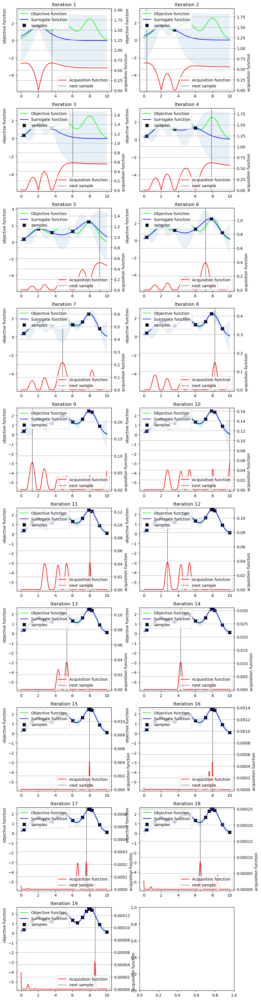

In [ ]:
plot_1D(multiple_gauss, xt, ft, acq_func, matern5, bounds_par=bounds_par, par_gp=par_gp, K=K, print_sigma=False)

## 2D test

In [ ]:
acq_func = EI_func_and_der
max_acq_method = 'direct'                                         # 'mqNm' or 'direct'
bounds_par = [(-5.,10.),(0.,15.)]
theta0, thetai, eps, var_noise = 1e4, 0, [0.02,0.02], 0           #( 1e4, 0, [0.02,0.02], 0          # best till now  (eps=50 if using PI) )
par_gp=[theta0, thetai, eps, var_noise]

start = time()
x_max, f_max, xt, ft, K = bayesian_optimization(branin, acq_func, max_acq_method, matern5, N_iter_bo=30, N_iter_min_max=[30,120], idx=[], bounds_par=bounds_par, par_gp=par_gp, initialization=[8.3,13.6])
end = time()
print(f"\nx_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")

N_iter = 1 	 Sampled point : [ 3.42592593 14.53703704] 	 f(x) = 126.50
N_iter = 2 	 Sampled point : [ 4.01577503 10.0994513 ] 	 f(x) = 205.40
N_iter = 3 	 Sampled point : [3.0829904  7.22565158] 	 f(x) = 260.12
N_iter = 4 	 Sampled point : [0.94535894 6.08024691] 	 f(x) = 277.49
N_iter = 5 	 Sampled point : [1.96730681 4.01806127] 	 f(x) = 283.45
N_iter = 6 	 Sampled point : [-0.17489712  3.46479195] 	 f(x) = 273.48
N_iter = 7 	 Sampled point : [1.34087791 4.68945283] 	 f(x) = 280.76
N_iter = 8 	 Sampled point : [2.24622771 1.04595336] 	 f(x) = 280.65
N_iter = 9 	 Sampled point : [4.38843164 2.23251029] 	 f(x) = 270.58
N_iter = 10 	 Sampled point : [2.14258497 2.47713763] 	 f(x) = 283.98
N_iter = 11 	 Sampled point : [-5.38408779e-01  1.27013159e-04] 	 f(x) = 236.92
N_iter = 12 	 Sampled point : [-2.99839963  7.41083676] 	 f(x) = 294.04
N_iter = 13 	 Sampled point : [-2.50685871  9.15294925] 	 f(x) = 307.55
N_iter = 14 	 Sampled point : [-4.51874714 10.19318701] 	 f(x) = 282.67
N_iter 

### Plot

In [ ]:
start = time()
plot_2D(xt, ft, acq_func, matern5, bounds_par=bounds_par, par_gp=par_gp, K=K)
end = time()
print("Execution time: ", end-start)

Execution time:  11.021516799926758


### Plots - comparison LBFGS / DIRECT

In [ ]:
def acq_func_max_mqNm_2(acq_func, xt, ft, kernel, theta0, thetai, eps, N_iter, bounds, K1, A, mu_max, idx, idx_cat, print_sigma):
  x_max, f_max = [], 0
  nfev = 0
  for i in range(N_iter):

    #select a random starting points
    mins, maxs = zip(*bounds)
    starting_point = np.random.uniform(low=mins, high=maxs, size=(len(xt[0]),))

    # maximise the acquisition function
    obj = minimize(acq_func, starting_point, jac=True, method='L-BFGS-B', bounds=bounds, options={'disp':-1, 'maxcor':1000}, args=(xt:=xt, ft:=ft, kernel:=kernel, theta0:=theta0, thetai:=thetai, eps:=eps, K1:=K1, A:=A, mu_max:=mu_max, idx:=idx, idx_cat:=idx_cat, print_sigma:=print_sigma))
    x_opt, f_opt = obj.x, obj.fun
    nfev += obj.nfev

    # if the new maximisation is higher than the previous ones and the new maximum point satisfy the given bounds, update the maximum found
    if f_opt <= f_max:       # < because the acquisition function is defined to be negative (BFGS is used to minimize such function)
      x_max, f_max = x_opt.reshape((1,len(xt[0]))), f_opt
  return [x_max, f_max, nfev]

In [ ]:
def acq_func_max_direct_2(acq_func, xt, ft, kernel, theta0, thetai, eps, bounds, K1, A, mu_max, idx, idx_cat, print_sigma):
  obj = direct(acq_func, bounds, args=(xt:=xt, ft:=ft, kernel:=kernel, theta0:=theta0, thetai:=thetai, eps:=eps, K1:=K1, A:=A, mu_max:=mu_max, idx:=idx, idx_cat:=idx_cat, print_sigma:=print_sigma, calc_der:=False), locally_biased=False)
  x_max, f_max, nfev = obj.x, obj.fun, obj.nfev
  return [x_max, f_max, nfev]

In [ ]:
# define the bayesian optimization algorithm
def bayesian_optimization_2(obj_func, acq_func, max_acq_method, kernel, N_iter_bo, N_iter_min_max, par_gp, bounds_par, N_iter_likeli=0, max_likeli_method='direct', bounds_par_gp=[], idx=[], idx_cat=[], std_added_noise=0, print_sigma=True, print_gp_par=True, initialization=[]):

  max_comp_time, nfev_total = 0, 0

  if N_iter_likeli!=0: #max likelihood approach
    eps = par_gp[0]
  else:
    theta0, var_noise, thetai, eps = par_gp

  K, Theta0, Var_noise, Thetai = [], [], [], []
  dim = len(bounds_par)

  if initialization == []:
    mins, maxs = zip(*bounds_par)
    xt = np.random.uniform(low=mins, high=maxs, size=(1,dim))
  else:
    xt = np.array(initialization).reshape(1,dim)
  ft = np.array([obj_func(xt[0])])                                                         # first function evaluation in a random point


  for i in range(1,N_iter_bo):                                                             # repeat the maximization of the acquisition function
    if N_iter_likeli!=0: #max likelihood approach
      match max_likeli_method:
        case 'mqNm': theta0, var_noise, thetai, f_max = likeli_max_mqNm(likelihood_to_be_max, xt, ft, kernel, N_iter_likeli, bounds_par_gp, idx, idx_cat)
        case 'direct': theta0, var_noise, thetai, f_max = likeli_max_direct(likelihood_to_be_max, xt, ft, kernel, bounds_par_gp, idx, idx_cat)
        case other:
          print('No method for likelihood maximisation')
          break

      if print_gp_par:
        print("\ntheta0 = ", theta0)
        print('var_noise = ',var_noise)
        print("thetai = ", thetai)

      Theta0.append(theta0)
      Var_noise.append(var_noise)
      Thetai.append(thetai)
      K = np.array([[kernel(xt[i],xt[j],theta0,thetai, idx, idx_cat) for j in range(len(xt))] for i in range(len(xt))]) # K changes each iteration because theta0 and thetai change
      K1, A, mu_max = gp_var(xt, ft, kernel, theta0, thetai, var_noise, K, idx, idx_cat, flag_modify_K=False)

    else:
      K, K1, A, mu_max = gp_var(xt, ft, kernel, theta0, thetai, var_noise, K, idx, idx_cat)

    match max_acq_method:
      case 'mqNm':
        start_max = time()
        N_iter_max_eff = round((N_iter_min_max[1]-N_iter_min_max[0])/(1+np.exp(-0.3*(i-N_iter_bo/2))) + N_iter_min_max[0])
        x_max, f_max, nfev = acq_func_max_mqNm_2(acq_func, xt, ft, kernel, theta0, thetai, eps, N_iter_max_eff, bounds_par, K1, A, mu_max, idx, idx_cat, print_sigma)
        end_max = time()
        max_comp_time += end_max - start_max
        nfev_total += nfev
      case 'direct':
        start_max = time()
        x_max, f_max, nfev = acq_func_max_direct_2(EI_func_and_der, xt, ft, kernel, theta0, thetai, eps, bounds_par, K1, A, mu_max, idx, idx_cat, print_sigma)
        end_max = time()
        max_comp_time += end_max - start_max
        nfev_total += nfev
      case other:
        print('No method for maximisation of the acquisition function')
        break

    x_max = x_max.reshape(1,dim)

    q = np.random.normal(0,std_added_noise)                                                # add random noise to the samples
    xt = np.append(xt, x_max, 0)                                                           # append new samples to xt and ft
    ft = np.append(ft, obj_func(xt[-1])+q)

  idx_max = np.argmax(ft)                                                                  # select the final result as the sample with the higher function value

  if N_iter_likeli!=0:
    return xt[idx_max], ft[idx_max], xt, ft, Theta0, Var_noise, Thetai, nfev
  else:
    return xt[idx_max], ft[idx_max], xt, ft, K, nfev_total, max_comp_time

In [ ]:
nfev_list, max_comp_time_list = np.zeros(2), np.zeros(2)
for ij in range(2):
  match ij:
    case 0: max_acq_method = 'mqNm'
    case 1: max_acq_method = 'direct'
  x_max, f_max, xt, ft, K, nfev, max_comp_time = bayesian_optimization_2(branin, acq_func, max_acq_method, matern5, N_iter_bo=30, N_iter_min_max=[30,120], idx=[], bounds_par=bounds_par, par_gp=par_gp, print_sigma=False, initialization=[8.3,13.6])
  nfev_list[ij], max_comp_time_list[ij] = nfev, max_comp_time

  print(f"x_max = {x_max}")
  print(f"f_max = {f_max} \n\n")

print(f'Number of function evaluations: {nfev_list}')
print(f'Maximization computation time: {max_comp_time_list}')

x_max = [-3.7475188  13.55325152]
f_max = 316.5795015558043 


x_max = [-3.69265356 13.58901082]
f_max = 316.6415199169764 


Number of function evaluations: [31059. 58611.]
Maximization computation time: [86.06055617  9.0334053 ]


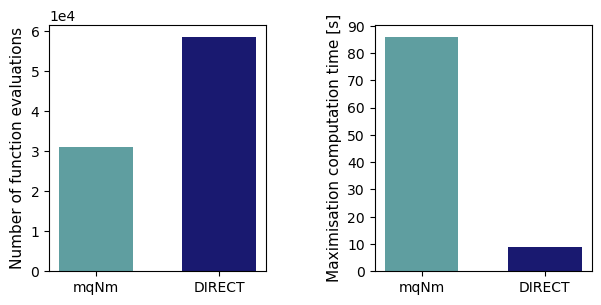

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(7, 3.2))
plt.subplots_adjust(wspace=0.5)

ax1.bar([1,2], nfev_list, 0.6, color=['cadetblue','midnightblue'], tick_label=['mqNm', 'DIRECT'])
ax1.set_ylabel('Number of function evaluations', fontsize=11)
ax1.ticklabel_format(style='sci', axis='y', scilimits=(0,0))

#ax2.grid(alpha=0.4)
ax2.bar([1,2], max_comp_time_list, 0.6, color=['cadetblue','midnightblue'], tick_label=['mqNm', 'DIRECT'])
ax2.set_ylabel('Maximisation computation time [s]', fontsize=11)
ax2.set_yticks([i*10 for i in range(10)])

## Dataset ML

In [ ]:
# WHEN USING COLAB, RUN THE LAST ROW TO COPY THE REPOSITORY. AND ALSO RUN LINE 20 (AND COMMENT LINE 21) IN THE FOLLOWING CELL

!git clone https://github.com/Filorland/Information-Theory-and-Inference.git "C:\Users\andre\Desktop\UniPD\Information theory and inference\Project\Training_data"
#!git clone https://github.com/Filorland/Information-Theory-and-Inference.git

Cloning into 'Information-Theory-and-Inference'...
remote: Enumerating objects: 19, done.
remote: Counting objects: 100% (19/19), done.
remote: Compressing objects: 100% (9/9), done.
remote: Total 19 (delta 1), reused 0 (delta 0), pack-reused 0
Unpacking objects: 100% (19/19), 17.36 MiB | 10.38 MiB/s, done.


In [ ]:
# helper function to load Kuzushiji-MNIST dataset
def load_mnist(path, kind='train'):
    import os
    import gzip
    labels_path = os.path.join(path, 'K%s-labels-idx1-ubyte.gz' % kind)
    images_path = os.path.join(path, 'K%s-images-idx3-ubyte.gz' % kind)
    with gzip.open(labels_path, 'rb') as lbpath:
        labels = np.frombuffer(lbpath.read(), dtype=np.uint8,offset=8)
    with gzip.open(images_path, 'rb') as imgpath:
        images = np.frombuffer(imgpath.read(), dtype=np.uint8,offset=16).reshape(len(labels), 784)
    return images, labels

#fix your ID ("numero di matricola") and the seed for random generator (as usual you can try different seeds)
ID = 1122632
np.random.seed(ID)

#load the K-MNIST dataset from the 'data' folder and let's normalize the features so that each value is in [0,1]

#X, y = load_mnist('/content/Information-Theory-and-Inference/SVM/data')
X, y = load_mnist('C:\\Users\\andre\\Desktop\\UniPD\\Information theory and inference\\Project\\Training_data\\training_data\\data')

# rescale the data
X, y = X / 255., y # original pixel values are between 0 and 255
print(X.shape, y.shape)

# Random permute the data and split into training and test taking the first 600
# data samples as training and 4000 samples as test
permutation = np.random.permutation(X.shape[0])

X = X[permutation]
y = y[permutation]

m_training = 2400
m_test = 4000

X_train, X_test = X[:m_training], X[m_training:m_training+m_test]
y_train, y_test = y[:m_training], y[m_training:m_training+m_test]

labels, freqs = np.unique(y_train, return_counts=True)
print("Labels in training dataset: ", labels)
print("Frequencies in training dataset: ", freqs)

(60000, 784) (60000,)
Labels in training dataset:  [0 1 2 3 4 5 6 7 8 9]
Frequencies in training dataset:  [245 239 232 254 243 228 267 232 207 253]


## SVM

### 2D

In [ ]:
# objective function
def SVM_2D(par):
  # C = regularization parameter,  gamma = 1/sig of the gaussian kernel
  C , gamma = par
  clf = svm.SVC(C = C, gamma = gamma)
  clf.fit(X_train, y_train)
  return clf.score(X_test, y_test)

In [ ]:
theta0, thetai, eps, var_noise = 0.03, [0.01,20], 0.01, 0.005                      # best parameters

bounds_par = [(0.1,20), (0.001,0.5)]

start = time()
x_max, f_max, xt, ft, K = bayesian_optimization(SVM_2D, EI_func_and_der, 'mqNm', matern5, N_iter_bo=30, N_iter_min_max=[10,300], bounds_par=bounds_par, par_gp=[theta0, var_noise, thetai, eps])
end = time()
print(f"\nx_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")

N_iter = 1 	 Sampled point : [16.31934872  0.03108906] 	 f(x) = 0.85
N_iter = 2 	 Sampled point : [10.3332491   0.08776854] 	 f(x) = 0.43
N_iter = 3 	 Sampled point : [1.7238238e+01 1.0000000e-03] 	 f(x) = 0.84
N_iter = 4 	 Sampled point : [11.04384142  0.02521749] 	 f(x) = 0.88
N_iter = 5 	 Sampled point : [14.08172461  0.03267721] 	 f(x) = 0.85
N_iter = 6 	 Sampled point : [1.51762646e+01 1.00000000e-03] 	 f(x) = 0.83
N_iter = 7 	 Sampled point : [18.60620861  0.05253478] 	 f(x) = 0.70
N_iter = 8 	 Sampled point : [1.45539732e+01 1.00000000e-03] 	 f(x) = 0.83
N_iter = 9 	 Sampled point : [1.42892398e+01 6.40264601e-03] 	 f(x) = 0.88
N_iter = 10 	 Sampled point : [16.76528054  0.04735583] 	 f(x) = 0.75
N_iter = 11 	 Sampled point : [1.44200515e+01 1.00000000e-03] 	 f(x) = 0.83
N_iter = 12 	 Sampled point : [1.64593709e+01 9.69253205e-03] 	 f(x) = 0.89
N_iter = 13 	 Sampled point : [1.45577145e+01 1.00000000e-03] 	 f(x) = 0.83
N_iter = 14 	 Sampled point : [1.44846871e+01 1.28564752e-0

#### Plot

In [ ]:
start = time()
plot_2D(xt, ft, EI_func_and_der, matern5, bounds_par=bounds_par, par_gp=[theta0, var_noise, thetai, eps], K=K)
end = time()
print("Execution time: ", end-start)

Execution time:  11.242538928985596


#### GridSearch

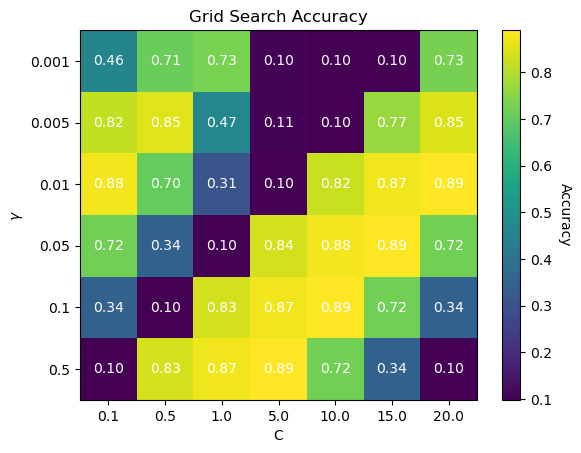

In [ ]:
svc = svm.SVC()
parameters = {'C':[0.1, 0.5, 1, 5, 10, 15, 20], 'gamma':[1e-3, 5e-3, 1e-2, 5e-2, 0.1, 0.5]}

# don't use CV, instead we use the whole training test to train and the test set to evaluate the performance
X_train_gs, y_train_gs = X[:(m_training+m_test)], y[:(m_training+m_test)]
cv = PredefinedSplit([-1 if i<m_training else 0 for i in range(len(y_train_gs))])

clf = GridSearchCV(svc, parameters, cv=cv)
clf.fit(X_train_gs, y_train_gs)

param_values, mean_scores = clf.cv_results_['params'], clf.cv_results_['mean_test_score']       # save params and accuracy values

param_accuracy = {}                                                                             # dictionary to associate param values to their accuracy
for params, score in zip(param_values, mean_scores):
    param_accuracy[str(params)] = score

# Plot data
param_combinations = len(param_values)
x_plot, y_plot, accuracy = np.zeros(param_combinations), np.zeros(param_combinations), np.zeros(param_combinations)   # x (C), y (gamma) and accuracy plot values

# Extract params and accuracy value for the plot
for i, params in enumerate(param_values):
    x_plot[i], y_plot[i], accuracy[i] = params['C'], params['gamma'], param_accuracy[str(params)]

# 2D plot
fig, ax = plt.subplots()
im = ax.imshow(accuracy.reshape(len(np.unique(y_plot)), len(np.unique(x_plot))), cmap='viridis', aspect='auto')

# Axis
ax.set_xticks(np.arange(len(np.unique(x_plot))))
ax.set_yticks(np.arange(len(np.unique(y_plot))))
ax.set_xticklabels(np.unique(x_plot))
ax.set_yticklabels(np.unique(y_plot))
ax.set_xlabel('C')
ax.set_ylabel(r'$\gamma$')

# Print accuracy values in the plot
for i in range(len(np.unique(y_plot))):
    for j in range(len(np.unique(x_plot))):
        text = ax.text(j, i, "{:.2f}".format(accuracy[i * len(np.unique(x_plot)) + j]), ha="center", va="center", color="w")

ax.set_title('Grid Search Accuracy')
cbar = ax.figure.colorbar(im, ax=ax)                                                            # colorbar
cbar.ax.set_ylabel('Accuracy', rotation=-90, va="bottom")

plt.show()

### 5D (4 hyperparameters)

In [ ]:
# objective function
def SVM_5D(par):

  idx=[0]
  idx_cat = [[3, 4]]

  par = [round(val) if i in idx else val for i, val in enumerate(par)]          # round to integer

  for sublist in idx_cat:                                                       # "round" to categorical
    max_value = max(par[i] for i in sublist)
    for i in range(len(par)):
        if i in sublist:
            par[i] = 1 if par[i] == max_value else 0

  degree, C, gamma, *kernel = par

  ker = {0: 'rbf', 1: 'poly'}                                                   # convert categorical variables to the SVM parameter

  index = kernel.index(1)
  kernel = ker.get(index)

  clf = svm.SVC(degree = round(degree), gamma = gamma, C = C, kernel = kernel)
  clf.fit(X_train, y_train)
  a = clf.score(X_test, y_test, sample_weight=None)

  return a

In [ ]:
acq_func = EI_func_and_der
bounds_par = [(0,4), (1., 10.), (0.001, 0.05), (0.,1.), (0.,1.)]
theta0, thetai, eps, var_noise = 0.03, [0.025, 0.1, 1, 0.5, 0.5], 1, 0

start = time()
x_max, f_max, xt, ft, K = bayesian_optimization(SVM_5D, acq_func, 'direct', matern5, N_iter_bo=20, N_iter_min_max=[30,300], bounds_par=bounds_par, par_gp=[theta0, var_noise, thetai, eps], idx=[0], idx_cat=[[3, 4]], print_sigma=False)
end = time()
print(f"\nx_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")

N_iter = 1 	 Sampled point : [3.33333333 8.5        0.0255     0.05555556 0.94444444] 	 f(x) = 0.85
N_iter = 2 	 Sampled point : [0.66666667 8.5        0.00916667 0.94444444 0.05555556] 	 f(x) = 0.89
N_iter = 3 	 Sampled point : [0.22222222 6.5        0.04183333 0.83333333 0.83333333] 	 f(x) = 0.79
N_iter = 4 	 Sampled point : [3.77777778e+00 2.50000000e+00 3.72222222e-03 8.33333333e-01
 8.33333333e-01] 	 f(x) = 0.86
N_iter = 5 	 Sampled point : [0.22222222 2.5        0.04183333 0.94444444 0.16666667] 	 f(x) = 0.79
N_iter = 6 	 Sampled point : [0.22222222 2.5        0.00916667 0.05555556 0.83333333] 	 f(x) = 0.10
N_iter = 7 	 Sampled point : [3.77777778e+00 5.50000000e+00 3.72222222e-03 8.33333333e-01
 8.33333333e-01] 	 f(x) = 0.87
N_iter = 8 	 Sampled point : [3.77777778 1.5        0.04183333 0.83333333 0.16666667] 	 f(x) = 0.79
N_iter = 9 	 Sampled point : [3.77777778 9.5        0.04183333 0.83333333 0.16666667] 	 f(x) = 0.79
N_iter = 10 	 Sampled point : [3.77777778 5.5        0.041

## NN

### 2D

In [ ]:
# objective function
def NN_2D(par):
  lr = par[0]
  bs = int(par[1])


  mlp = MLPClassifier(hidden_layer_sizes=(40,), batch_size=bs,
                      learning_rate_init=lr,
                    max_iter=3000, alpha=1e-4, solver='sgd',
                    tol=1e-4, random_state=ID)

  mlp.fit(X_train, y_train)

  return mlp.score(X_test, y_test)

In [ ]:
theta0, thetai, eps, var_noise = 0.3, [0.15, 2e-5], 0.01, 0.0007                 # 0.3, [0.2, 2e-5], 0.01, 0.0007 best till now

bounds_par = [(1e-3,1),(1,600)]

start = time()
x_max, f_max, xt, ft, K = bayesian_optimization(NN_2D, EI_func_and_der, 'direct', matern5, N_iter_bo=20, N_iter_min_max=[30,300], idx=[1], bounds_par=bounds_par, par_gp=[theta0, var_noise, thetai, eps])
end = time()
print(f"\nx_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")

N_iter = 1 	 Sampled point : [1.83944444e-01 4.75516461e+02] 	 f(x) = 0.83
N_iter = 2 	 Sampled point : [  0.99997462 420.28174059] 	 f(x) = 0.47
N_iter = 3 	 Sampled point : [1.00845908e-03 3.96209750e+02] 	 f(x) = 0.81
N_iter = 4 	 Sampled point : [1.02537723e-03 2.42343774e+02] 	 f(x) = 0.81
N_iter = 5 	 Sampled point : [1.02537723e-03 5.90915943e+02] 	 f(x) = 0.81
N_iter = 6 	 Sampled point : [1.00845908e-03 3.11394782e+02] 	 f(x) = 0.81
N_iter = 7 	 Sampled point : [1.00845908e-03 5.16447975e+02] 	 f(x) = 0.81
N_iter = 8 	 Sampled point : [  0.99992387 106.03726566] 	 f(x) = 0.15
N_iter = 9 	 Sampled point : [  0.83334774 599.58916324] 	 f(x) = 0.23
N_iter = 10 	 Sampled point : [1.00281969e-03 4.63414529e+02] 	 f(x) = 0.81
N_iter = 11 	 Sampled point : [  0.47994444 275.84979424] 	 f(x) = 0.82
N_iter = 12 	 Sampled point : [1.48619342e-01 2.85983768e+02] 	 f(x) = 0.82
N_iter = 13 	 Sampled point : [1.00281969e-03 4.85782308e+02] 	 f(x) = 0.81
N_iter = 14 	 Sampled point : [1.0084

In [ ]:
start = time()
plot_2D(xt, ft, EI_func_and_der, matern5, idx=[1], bounds_par=bounds_par, par_gp=[theta0, var_noise, thetai, eps], K=K)
end = time()
print("Execution time: ", end-start)

Execution time:  7.10524845123291


#### Grid search

In [ ]:
lr_list = [1e-3, 1e-2, 0.1, 0.5, 1]
batch_size_list = [50,100,200,400,600]
parameters = {'learning_rate_init': lr_list, 'batch_size': batch_size_list}#,  'hidden_layer_sizes': [(10,), (20,), (40,)]}#, (20,20,), (40,20,10) ]}

'''mlp = MLPClassifier(batch_size=32,
                    max_iter=100, alpha=1e-4, solver='sgd',
                    tol=1e-4, random_state=ID)'''
mlp = MLPClassifier(hidden_layer_sizes=(40,),
                    max_iter=3000, alpha=1e-4, solver='sgd',
                    tol=1e-4, random_state=ID)

gs = GridSearchCV(mlp, parameters,cv=5)
gs.fit(X_train, y_train)

print ('RESULTS FOR NN\n')
print("Best parameters set found:", gs.best_params_)
print("Score with best parameters:",gs.best_score_)

print("\nAll scores on the grid:")
df = DataFrame(gs.cv_results_)
df = df[['param_learning_rate_init', 'param_batch_size','mean_test_score']] #'param_hidden_layer_sizes'

#display(df.iloc[:, 4:])
display(df)

RESULTS FOR NN

Best parameters set found: {'batch_size': 50, 'learning_rate_init': 0.1}
Score with best parameters: 0.8391666666666666

All scores on the grid:


,param_learning_rate_init,param_batch_size,mean_test_score
0,0.001,50,0.808333
1,0.01,50,0.811250
2,0.1,50,0.839167
3,0.5,50,0.331667
4,1,50,0.122083
5,0.001,100,0.807917
6,0.01,100,0.807500
7,0.1,100,0.825417
8,0.5,100,0.738750
9,1,100,0.162917


### 5D

In [ ]:
# objective function
def NN_5D(par):

  idx=[1] #Round batch size
  idx_cat = [[2, 3, 4]] #categorical - solver

  par = [round(val) if i in idx else val for i, val in enumerate(par)]          # round to integer

  for sublist in idx_cat:                                                       # "round" to categorical
    max_value = max(par[i] for i in sublist)
    for i in range(len(par)):
        if i in sublist:
            par[i] = 1 if par[i] == max_value else 0

  lr, bs, *solver = par

  solver_choices = {0: 'lbfgs', 1: 'sgd', 2: 'adam'}                                                   # convert categorical variables to the SVM parameter
  index = solver.index(1)
  solver = solver_choices.get(index)

  mlp = MLPClassifier(hidden_layer_sizes=(40,), batch_size=bs,  #batch_size=32,
                      learning_rate_init=lr,
                    max_iter=150, alpha=1e-4, solver=solver,
                    tol=1e-4, random_state=ID)

  mlp.fit(X_train, y_train)

  return mlp.score(X_test, y_test)

In [ ]:
theta0, thetai, eps, var_noise = 0.5, [1.5, 0.008, 0.01, 0.01, 0.01], 0.01, 0
bounds_par = [(0.0002,2),(1,500),(0,1),(0,1),(0,1)]
max_acq_method = 'direct'

start = time()
x_max, f_max, xt, ft, K = bayesian_optimization(NN_5D, EI_func_and_der, max_acq_method, matern5, N_iter_bo=30, N_iter_min_max=[], idx=[1], idx_cat=[[2,3,4]], bounds_par=bounds_par, par_gp=[theta0, var_noise, thetai, eps], print_sigma=False)
end = time()
print(f"\nx_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")

N_iter = 1 	 Sampled point : [1.07416667e+00 2.32018519e+02 9.93827160e-01 6.17283951e-03
 6.17283951e-03] 	 f(x) = 0.80
N_iter = 2 	 Sampled point : [1.04124815e+00 2.42286008e+02 9.97942387e-01 2.05761317e-03
 6.17283951e-03] 	 f(x) = 0.80
N_iter = 3 	 Sampled point : [1.55148519e+00 2.38179012e+02 2.05761317e-03 8.33333333e-01
 8.33333333e-01] 	 f(x) = 0.14
N_iter = 4 	 Sampled point : [5.80388889e-01 2.38179012e+02 9.93827160e-01 6.17283951e-03
 6.17283951e-03] 	 f(x) = 0.80
N_iter = 5 	 Sampled point : [6.05077778e-01 2.25858025e+02 9.93827160e-01 6.17283951e-03
 6.17283951e-03] 	 f(x) = 0.80
N_iter = 6 	 Sampled point : [6.54455556e-01 2.50500000e+02 9.93827160e-01 6.17283951e-03
 6.17283951e-03] 	 f(x) = 0.80
N_iter = 7 	 Sampled point : [1.07416667e+00 2.50500000e+02 9.93827160e-01 6.17283951e-03
 6.17283951e-03] 	 f(x) = 0.80
N_iter = 8 	 Sampled point : [7.86129630e-01 2.29965021e+02 6.17283951e-03 8.33333333e-01
 8.33333333e-01] 	 f(x) = 0.79
N_iter = 9 	 Sampled point : [8.

### 7D

In [ ]:
#more data
m_training = 2400
m_test = 4000

X_train, X_test = X[:m_training], X[m_training:m_training+m_test:]
y_train, y_test = y[:m_training], y[m_training:m_training+m_test:]

In [ ]:
# objective function
def NN_7D(par):

  idx=[2,3] #Round batch size and #neurons
  idx_cat = [[4, 5, 6]] #categorical - solver

  par = [round(val) if i in idx else val for i, val in enumerate(par)]          # round to integer

  for sublist in idx_cat:                                                       # "round" to categorical
    max_value = max(par[i] for i in sublist)
    for i in range(len(par)):
        if i in sublist:
            par[i] = 1 if par[i] == max_value else 0

  lr, a, bs, neurons, *solver = par

  solver_choices = {0: 'lbfgs', 1: 'sgd', 2: 'adam'}                                                   # convert categorical variables to the SVM parameter
  index = solver.index(1)
  solver = solver_choices.get(index)

  mlp = MLPClassifier(hidden_layer_sizes=(neurons,), batch_size=bs,  #batch_size=32,
                      learning_rate_init=lr,
                    max_iter=300, alpha=a, solver=solver,
                    tol=1e-4, random_state=ID)

  mlp.fit(X_train, y_train)

  return mlp.score(X_test, y_test)

In [ ]:
theta0, thetai, eps, var_noise = 0.5, [1.5, 0.5, 0.008, 0.05, 0.01, 0.01, 0.01], 0.01, 0
bounds_par = [(0.0002,2),(0.00001, 0.1),(1,500),(5,50),(0,1),(0,1),(0,1)]
max_acq_method = 'direct'
idx=[2,3] #Round batch size and #neurons
idx_cat = [[4, 5, 6]] #solver

start = time()
x_max, f_max, xt, ft, K = bayesian_optimization(NN_7D, EI_func_and_der, max_acq_method, matern5, N_iter_bo=20, N_iter_min_max=[], idx=idx, idx_cat=idx_cat, bounds_par=bounds_par, par_gp=[theta0, var_noise, thetai, eps], print_sigma=False)
end = time()
print(f"\nx_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")

N_iter = 1 	 Sampled point : [1.66670000e+00 5.56500000e-03 1.95055556e+02 4.91666667e+01
 1.85185185e-02 9.81481481e-01 1.85185185e-02] 	 f(x) = 0.18
N_iter = 2 	 Sampled point : [1.37043333e+00 1.66750000e-02 1.95055556e+02 4.25000000e+01
 1.85185185e-02 9.81481481e-01 1.85185185e-02] 	 f(x) = 0.10
N_iter = 3 	 Sampled point : [7.03833333e-01 9.44450000e-02 1.95055556e+02 3.25000000e+01
 5.55555556e-02 9.44444444e-01 5.55555556e-02] 	 f(x) = 0.28
N_iter = 4 	 Sampled point : [3.72333333e-02 1.86166667e-03 1.95055556e+02 2.75000000e+01
 1.85185185e-02 1.85185185e-02 9.81481481e-01] 	 f(x) = 0.76
N_iter = 5 	 Sampled point : [1.35988889e-01 1.66750000e-02 1.95055556e+02 2.47222222e+01
 6.17283951e-03 1.85185185e-02 9.81481481e-01] 	 f(x) = 0.43
N_iter = 6 	 Sampled point : [4.48714815e-01 2.15740741e-04 1.86841564e+02 2.75000000e+01
 8.33333333e-01 2.05761317e-03 8.33333333e-01] 	 f(x) = 0.79
N_iter = 7 	 Sampled point : [5.22781481e-01 2.15740741e-04 1.93002058e+02 2.75000000e+01
 8.3

## Posterior maximisation

In [ ]:
def verify_max_likelihood(xt, ft, kernel, likelihood, bounds, idx, idx_cat, n_points=50):
  L = []
  Theta0 = np.linspace(bounds[0][0], bounds[0][1], n_points)

  match len(bounds):
    case 2: idx_thetai, Var_noise = 1, [0]
    case x if x>2: idx_thetai, Var_noise = 2, np.linspace(bounds[1][0], bounds[1][1], n_points)

  thetai_i=[]
  for i in range(idx_thetai,len(bounds)):
    thetai_i.append(np.linspace(bounds[i][0],bounds[i][1],n_points))
  Thetai = list(product(*thetai_i))

  for theta0 in Theta0:
    for thetai in Thetai:
      for var_noise in Var_noise:
        L.append(-likelihood([theta0,var_noise]+list(thetai), xt, ft, kernel, [], []))

  return max(L)

To run the following three cells, we need to run BO on some problems and retain a list a xt and ft

Maximisation with multistarted quasi-Newton method

In [ ]:
n = 1
bounds_par_gp = [(1e3,1e5), (1e-15,2), (0.001,2), (0.001,2)]

st = time()
t0m, vnm, t1m, lm = likeli_max_mqNm(likelihood_to_be_max, xt[:n], ft[:n], matern5, 100, bounds_par_gp, [], [])
en = time()
print(f'Theta0 = {t0m:.3f}')
print(f'Var noise = {vnm}')
print(f'Theta1 = {t1m}')
print(f'Max likeli = {lm:.3e}')
print(f'\nExec. time = {en-st:3e}')

Theta0 = 13194.853
Var noise = 1.6325266749857912
Theta1 = [0.08614545 1.60517995]
Max likeli = 2.181e-03

Exec. time = 1.066234e-01


Maximisation with DIRECT method

In [ ]:
st = time()
t0m, vnm, t1m, lm = likeli_max_direct(likelihood_to_be_max, xt[:n], ft[:n], matern5, bounds_par_gp, [1], [])
en = time()
print(f'Theta0 = {t0m:.3f}')
print(f'Var noise = {vnm}')
print(f'Theta1 = {t1m}')
print(f'Max likeli = {lm:.3e}')
print(f'\nExec. time = {en-st:3e}')

Theta0 = 13833.333
Var noise = 0.1111111111111121
Theta1 = [1.0005     1.66683333]
Max likeli = 2.177e-03

Exec. time = 4.509153e-01


Maximisation with exaustive search

In [ ]:
verify_max_likelihood(xt[:n], ft[:n], matern5, likelihood_to_be_max, bounds_par_gp, [], [], n_points=30)

0.0021798109583341624

### 1D test

In [ ]:
acq_func = EI_func_and_der

bounds_par = [(0.,10.)]
bounds_par_gp = [(1,15), (1e-15,0.05), (0.05,5)]
par_gp=[0]

start = time()
x_max, f_max, xt, ft, Theta0, Var_noise, Thetai = bayesian_optimization(multiple_gauss, acq_func, 'direct', matern5, N_iter_bo=15, N_iter_min_max=[10,80], par_gp=par_gp, bounds_par=bounds_par, N_iter_likeli=30, max_likeli_method='direct', bounds_par_gp=bounds_par_gp)
end = time()

print(f"x_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")


theta0 =  2.2962962962962967
var_noise =  0.036111111111111385
thetai =  [4.725]
N_iter = 1 	 Sampled point : [6.11957866] 	 f(x) = 1.22

theta0 =  1.8930041152263377
var_noise =  0.02054183813443132
thetai =  [0.14166667]
N_iter = 2 	 Sampled point : [4.17593863] 	 f(x) = 1.57

theta0 =  1.2976680384087795
var_noise =  0.024154092363969426
thetai =  [0.05113169]
N_iter = 3 	 Sampled point : [1.10780877] 	 f(x) = 1.07

theta0 =  1.0003556368439774
var_noise =  0.021690037087842867
thetai =  [0.05012574]
N_iter = 4 	 Sampled point : [4.10938373] 	 f(x) = 1.51

theta0 =  1.3104709647919528
var_noise =  6.985723721077489e-05
thetai =  [0.19221536]
N_iter = 5 	 Sampled point : [4.95320271] 	 f(x) = 2.01

theta0 =  1.352436112381243
var_noise =  4.233771962121077e-07
thetai =  [0.19489788]
N_iter = 6 	 Sampled point : [9.99999059] 	 f(x) = 0.11

theta0 =  1.0001185456146593
var_noise =  1.411257327382752e-07
thetai =  [0.2333473]
N_iter = 7 	 Sampled point : [9.40838212e-06] 	 f(x) = 0.22


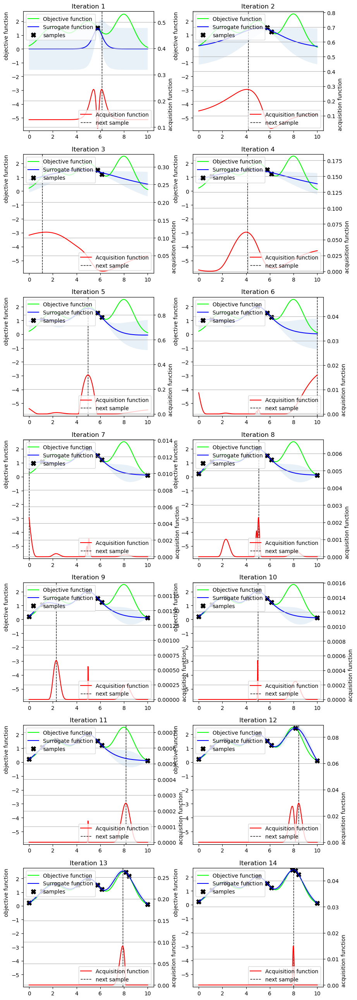

In [ ]:
plot_1D(multiple_gauss, xt, ft, acq_func, matern5, bounds_par, par_gp, Theta0=Theta0, Var_noise=Var_noise, Thetai=Thetai)

### 2D test

In [ ]:
acq_func = EI_func_and_der
bounds_par = [(-5.,10.),(0.,15.)]
bounds_par_gp = [(1e3,1e5), (1e-15,2), (0.001,2), (0.001,2)]
par_gp=[150]

start = time()
x_max, f_max, xt, ft, Theta0, Var_noise, Thetai = bayesian_optimization(branin, acq_func, 'mqNm', matern5, N_iter_bo=20, N_iter_min_max=[80,200], par_gp=par_gp, bounds_par=bounds_par, N_iter_likeli=200, max_likeli_method='mqNm', bounds_par_gp=bounds_par_gp)
end = time()

print(f"\nx_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")


theta0 =  44367.66165542327
var_noise =  0.1839337887775374
thetai =  [1.54388972 0.60200847]
N_iter = 1 	 Sampled point : [-1.61938726  1.36400569] 	 f(x) = 241.53

theta0 =  45093.98531375103
var_noise =  1.1528956290825108
thetai =  [0.13791539 0.03744058]
N_iter = 2 	 Sampled point : [-2.57863937  6.68677697] 	 f(x) = 292.73

theta0 =  46941.07326325539
var_noise =  0.9652083223932659
thetai =  [0.15071771 0.06580158]
N_iter = 3 	 Sampled point : [-3.86877232  3.73599152] 	 f(x) = 209.29

theta0 =  17332.640476452132
var_noise =  0.00747213641965316
thetai =  [0.6986949  0.00854854]
N_iter = 4 	 Sampled point : [-1.77046246 14.45321557] 	 f(x) = 273.40

theta0 =  21563.040284884206
var_noise =  0.35521545461133786
thetai =  [0.37586814 0.03733442]
N_iter = 5 	 Sampled point : [-1.25459436 10.40838572] 	 f(x) = 288.41

theta0 =  72324.28288216342
var_noise =  0.7095625520166445
thetai =  [0.47661316 0.02263755]
N_iter = 6 	 Sampled point : [-3.47915396 12.68673035] 	 f(x) = 316.28


In [ ]:
plot_2D(xt, ft, acq_func, matern5, bounds_par, par_gp, Theta0=Theta0, Var_noise=Var_noise, Thetai=Thetai)

## Metropolis

In [ ]:
# 1/x * log_normal distribution
def proposal_dist(x, mu, sig):
  mu, sig, d = np.array(mu), np.array(sig), len(mu)
  A = (2*np.pi)**(d/2)*np.exp(sum(sig**2/2-mu))*np.prod(sig)          # normalization constant of the distribution
  M = 1/((2*np.pi)**(d/2)*np.prod(sig))                               # maximum of the distribution
  P = np.exp(-sum((x-mu)**2/(2*sig**2)+x))                            # value of the distribution at position x (without considering the normalization)
  return P/A/M                                                        # return the value of the distribution already divided by the maximum

In [ ]:
def rejection_sampling(target_func, mu, sig, num_samples=1):
    samples = []
    dim = len(mu)
    bounds = [(mu[i]-sig[i]**2-3*sig[i],mu[i]-sig[i]**2+3*sig[i]) for i in range(dim)]        # it is generally a good domain, which truncated only low-probability tails
    mins, maxs = zip(*bounds)

    while len(samples) < num_samples:
        x = np.random.uniform(mins, maxs, size=dim)
        y = np.random.uniform(0, 1)

        target_value = target_func(x, mu, sig)

        if y < target_value :
            samples.append(x)

    if num_samples==1:
      samples = samples[0]
    return samples

In [ ]:
# note: likelihood = posterior when using a uniform prior
def likeli(curr_state, xt, ft, kernel, idx=[], idx_cat=[]):
  match len(curr_state):
    case 2: theta0, var_noise, thetai = curr_state[0], 0, [curr_state[1]]
    case 3: theta0, var_noise, thetai = curr_state[0], curr_state[1], [curr_state[2]]
    case x if x>3: theta0, var_noise, thetai = curr_state[0], curr_state[1], curr_state[2:]

  K = np.array([[kernel(xt[i],xt[j],theta0,thetai,idx,idx_cat) for j in range(len(xt))] for i in range(len(xt))]  + var_noise*np.eye(len(xt))) # kernel matrix
  K1 = pinv(K)
  A = np.dot(K1,ft)

  return [np.exp(-0.5*np.dot(ft,A)-0.5*np.log(det(K))-0.5*len(ft)*np.log(2*np.pi)), K, K1, A]

In [ ]:
def metropolis_hastings(xt, ft, kernel, likelihood, sigma_proposal, num_samples, bound_pars_gp, idx=[], idx_cat=[], burnin=0.2, thinning=1, print_iters=0):
  '''
  Parameters:
    - xt:   domain points in which we evaluated the objective function
    - ft:   values of the objective function already acquired
    - kernel:   kernel to use in the definition of the gaussian process (only matern5 available)
    - sigma_proposal:  sigma parameter of the proposal distribution of the metropolis algorithm
    - num_samples:   number of samples to be acquired by the metropolis algorithm
    - bounds_par_gp:    bounds of the parameters of the gaussian process.  It has to be a list of tuples (or lists), where each one contains the lower and upper bound for a
                          given gp parameter. The first cell is always dedicated to bounds_theta0. In the case where we want to optimize only theta0 and thetai, the second and
                          following cells are dedicated to bounds_thetai. In the other case the second cell is dedicated to bounds_var_noise, while the following ones to
                          bounds_thetai. Note that var_noise is fixed to 0 if it is not optimized by the likelihood procedure
    - idx:    list of indexes. Every index indicate in which dimension we have a variable of the objective function which only has integer values
    - idx_cat:  list of indexes. Every index indicate in which dimension we have a variable of the objective function which behaves as a categorical variable. Every cell of
                  idx_cat corresponds to a single categorical variable, and it is an array containing all the indexes associated to that variable
    - burnin:   percentage of num_samples to be discarded in the burn in phase
    - thinning:   thinning to be used in the metropolis algorithm
    - print_iters:    every print_iters iteration we print a line informing on how much samples have been acquires
  '''

  K1s, As, mu_maxs, samples, L = np.zeros((num_samples,len(xt),len(xt))), np.zeros((num_samples,len(xt))), np.zeros(num_samples), np.zeros((num_samples,len(bound_pars_gp))), np.zeros(num_samples)

  idx_burnin = int(burnin * num_samples)        # number of samples in the burn in phase
  dim = len(bound_pars_gp)

  # initialize the chain to the maximum of the likelihood
  t0m, vnm, t1m, lm = likeli_max_direct(likelihood_to_be_max, xt, ft, matern5, bound_pars_gp, [1], [])
  match dim:
    case 2: curr_state = [t0m]+list(t1m)
    case x if x>2:  curr_state = [t0m, vnm]+list(t1m)

  #np.random.uniform(low=mins, high=maxs, size=(dim,))                    # As an alternative, we can initialize the chain with a random state

  curr_likeli, K_curr, K1_curr, A_curr = likelihood(curr_state, xt, ft, kernel, idx, idx_cat)

  N, iteration, N_acc = 0, 0, 0
  while N < num_samples:
    proposal_state = np.exp(rejection_sampling(proposal_dist, np.log(curr_state), sigma_proposal))

    prop_likeli, K, K1, A = likelihood(proposal_state, xt, ft, kernel, idx, idx_cat)                 # Calculate the acceptance criterion
    accept_crit = prop_likeli / curr_likeli * (np.prod(proposal_state)/np.prod(curr_state))**2
    accept_threshold = np.random.uniform(0, 1)                                      # Generate a random number between 0 and 1

    # If the acceptance criterion is greater than the random number, accept the proposal state as the current state
    if accept_crit > accept_threshold:
      curr_state, curr_likeli = proposal_state, prop_likeli
      N_acc += 1

      match dim:
        case 2: K_without_noise = K
        case x if x>2: K_without_noise = K-proposal_state[1]*np.eye(len(xt))
      kT_2nd = K_without_noise[0,:]                                                              # search for the maximum mean within the sampled points
      mu_max = np.dot(kT_2nd,A)
      for i in range(1,len(xt)):
        kT_2nd = K_without_noise[i,:]
        mu_trial = np.dot(kT_2nd,A)
        if mu_trial > mu_max:
          mu_max = mu_trial

      K1_curr, A_curr, mu_max_curr = K1, A, mu_max

      if iteration >= idx_burnin and (iteration-idx_burnin)%thinning == 0 :
        K1s[N], As[N], mu_maxs[N], samples[N], L[N] = K1.reshape(1,len(xt),len(xt)), A.reshape(1,len(xt)), mu_max, curr_state.reshape((1,len(bound_pars_gp))), curr_likeli
        N += 1
    elif iteration >= idx_burnin and N != 0 and (iteration-idx_burnin)%thinning == 0:
      K1s[N], As[N], mu_maxs[N], samples[N], L[N] = K1_curr.reshape(1,len(xt),len(xt)), A_curr.reshape(1,len(xt)), mu_max_curr, curr_state.reshape((1,len(bound_pars_gp))), curr_likeli
      N += 1

    iteration += 1

    if print_iters!= 0 and iteration%print_iters==0 :
      print(f'Iter = {iteration}, {N}')

  return [K1s, As, mu_maxs, samples, L, N_acc, iteration-N_acc]

In [ ]:
# compute the mean of the acquisition function using different samples of the GP parameters (Monte Carlo method)
def mean_acq_func(x, xt, ft, acq_func, kernel, eps, K1s, As, mu_maxs, samples, idx, idx_cat, print_sigma):
  sum_acq, sum_der = 0, np.zeros(len(x))
  for i in range(len(mu_maxs)):
    acq, der = acq_func(x, xt, ft, kernel, samples[i][0], samples[i][2:], eps, K1s[i], As[i], mu_maxs[i], idx, idx_cat, print_sigma)
    sum_acq += acq
    sum_der += der
  return [1/len(samples)*sum_acq, 1/len(samples)*sum_der]

# same as before, without computing gradients
def mean_acq_func_without_der(x, xt, ft, acq_func, kernel, eps, K1s, As, mu_maxs, samples, idx, idx_cat, print_sigma):
  sum_acq = 0
  for i in range(len(mu_maxs)):
    acq = acq_func(x, xt, ft, kernel, samples[i][0], samples[i][2:], eps, K1s[i], As[i], mu_maxs[i], idx, idx_cat, print_sigma, calc_der=False)
    sum_acq += acq
  return 1/len(samples)*sum_acq

In [ ]:
# maximise the acquisition function with multistarted quasi-Newton method
def acq_func_max_mqNm_w_metr(acq_func, xt, ft, kernel, eps, N_iter_max, N_samples_metr, bounds_par_ml, bounds_par_gp, thinning, sigma_prop_dist, idx, idx_cat, print_sigma):
  x_max, f_max = [], 0
  start2 = time()
  K1s, As, mu_maxs, samples, _, _, _ = metropolis_hastings(xt, ft, kernel, likeli, sigma_prop_dist, N_samples_metr, bounds_par_gp, idx, idx_cat, thinning=thinning)
  end2=time()

  start4 = time()
  for i in range(N_iter_max):
    #select a random starting points
    mins, maxs = zip(*bounds_par_ml)
    starting_point = np.random.uniform(low=mins, high=maxs, size=(len(xt[0]),))

    # maximise the acquisition function
    obj = minimize(mean_acq_func, starting_point, jac=True, method='L-BFGS-B', bounds=bounds_par_ml, options={'disp':-1, 'maxcor':1000}, args=(xt:=xt, ft:=ft, acq_func:=acq_func, kernel:=kernel, eps:=eps, K1s:=K1s, As:=As, mu_maxs:=mu_maxs, samples:=samples, idx:=idx, idx_cat:=idx_cat, print_sigma:=print_sigma))
    x_opt, f_opt = obj.x, obj.fun

    # if the new maximisation is higher than the previous ones and the new maximum point satisfy the given bounds, update the maximum found
    if f_opt <= f_max:       # < because the acquisition function is defined to be negative (BFGS is used to minimize such function)
      x_max, f_max = x_opt.reshape((1,len(bounds_par_ml))), f_opt

  end4 = time()
  return [x_max, f_max, end2-start2, end4-start4]

In [ ]:
# maximise the acquisition function with DIRECT method
def acq_func_max_direct_w_metr(acq_func, xt, ft, kernel, eps, N_samples_metr, bounds_par_ml, bounds_par_gp, thinning, sigma_prop_dist, idx, idx_cat, print_sigma):
  start2 = time()
  K1s, As, mu_maxs, samples, _, _, _ = metropolis_hastings(xt, ft, kernel, likeli, sigma_prop_dist, N_samples_metr, bounds_par_gp, idx, idx_cat, thinning)
  end2=time()

  start4 = time()
  obj = direct(mean_acq_func_without_der, bounds_par_ml, args=(xt:=xt, ft:=ft, acq_func:=acq_func, kernel:=kernel, eps:=eps, K1s:=K1s, As:=As, mu_maxs:=mu_maxs, samples:=samples, idx:=idx, idx_cat:=idx_cat, print_sigma:=print_sigma), locally_biased=False)
  x_max, f_max = obj.x, obj.fun
  end4 = time()

  return [x_max, f_max, end2-start2, end4-start4]

In [ ]:
def bayesian_optimization_w_metr(obj_func, acq_func, max_acq_method, kernel, N_iter_bo, N_iter_min_max, eps, N_samples_metr, bounds_par_ml, bounds_par_gp, thinning, sigma_prop_dist, idx=[], idx_cat=[], std_added_noise=0, initialization=[], print_sigma=True):
  '''
  Parameters:
    - obj_func:   objective function to maximise
    - acq_func:   acquisition function to use (choose among PI_func_and_der, EI_func_and_der, GPUCB_func_and_der)
    - max_acq_method:   method to be used to maximise the acquisition function (choose among 'mqNm', 'direct')
    - kernel:   kernel to use in the definition of the gaussian process (only matern5 available)
    - N_iter_bo:    number of BO iterations to be performed
    - N_iter_min_max:   list with minimum and maximum number of iterations to be performed to maximise the acquisition function (only if max_acq_method=='mqNm')
                          The number of such iterations is scheduled by a logistic function:
                            N_iter_maximisation(iteration_bo) = (N_iter_max-N_iter_min)/(1+e^(-0.3*(iteration_bo-N_iter_bo/2))) + N_iter_min
    - eps:   value of the epsilon parameter
    - N_samples_metr:   number of samples to be acquired by the metropolis algorithm
    - bounds_par_ml:    bounds of the domain of the objective function. It has to be a list of tuples (or lists), where each one contains the lower and upper bound for a given
                          dimensions of the domain
    - bounds_par_gp:    bounds of the parameters of the gaussian process.  It has to be a list of tuples (or lists), where each one contains the lower and upper bound for a given
                          gp parameter. The first cell is always dedicated to bounds_theta0. In the case where we want to optimize only theta0 and thetai, the second and
                          following cells are dedicated to bounds_thetai. In the other case, the second cell is dedicated to bounds_var_noise, while the following ones to
                          bounds_thetai. Note that var_noise is fixed to 0 if it is not optimized by the likelihood procedure
    - thinning:   thinning to be used in the metropolis algorithm
    - sigma_prop_dist:  sigma parameter of the proposal distribution of the metropolis algorithm
    - idx:    list of indexes. Every index indicate in which dimension we have a variable of the objective function which only has integer values
    - idx_cat:  list of indexes. Every index indicate in which dimension we have a variable of the objective function which behaves as a categorical variable. Every cell of
                  idx_cat corresponds to a single categorical variable, and it is an array containing all the indexes associated to that variable
    - std_added_noise:    standard deviation of the noise to be applied to the evaluations of the objective function (gaussian channel)
    - initilization:    initial point where to evaluate the objective function for the first iteration. If if is a void list, the initialization will be set randomly
    - print_sigma:    boolean. If true, negative gp sigma's will be printed when encountered
  '''

  t_metr, t_iter, t_max = [], [], []

  if initialization == []:
    mins, maxs = zip(*bounds_par_ml)
    xt = np.random.uniform(low=mins, high=maxs, size=(1,len(bounds_par_ml)))
  else:
    xt = np.array(initialization).reshape(1,len(bounds_par_ml))
  ft = np.array([obj_func(xt[0])])

  for i in range(1,N_iter_bo):                                                             # repeat the maximization of the acquisition function
    start3 = time()
    match max_acq_method:
      case 'direct':
        x_max, f_max, temp2, temp4 = acq_func_max_direct_w_metr(acq_func, xt, ft, kernel, eps, N_samples_metr, bounds_par_ml, bounds_par_gp, thinning, sigma_prop_dist, idx, idx_cat, print_sigma)
      case 'mqNm':
        N_iter_max_eff = round((N_iter_min_max[1]-N_iter_min_max[0])/(1+np.exp(-0.3*(i-N_iter_bo/2))) + N_iter_min_max[0])
        x_max, f_max, temp2, temp4 =  acq_func_max_mqNm_w_metr(acq_func, xt, ft, kernel, eps, N_iter_max_eff, N_samples_metr, bounds_par_ml, bounds_par_gp, thinning, sigma_prop_dist, idx, idx_cat, print_sigma)

    t_metr.append(temp2)
    t_max.append(temp4)

    q = np.random.normal(0,std_added_noise)                                                # add random noise to the objective function evaluations
    xt = np.append(xt, x_max.reshape(1,len(xt[0])), 0)                                                           # append new samples to xt and ft
    ft = np.append(ft, obj_func(xt[-1])+q)
    end3 = time()
    t_iter.append(end3-start3)
    print(f'N_iter = {i} \t Sampled point : {xt[-1]} \t f(x) = {ft[-1]:.2f} \t Max acq. function = {f_max}')
    print(f'Execution single run {t_iter[-1]}\n')

  idx_max = np.argmax(ft)                                                                  # select the final result as the sample with the higher function value
  return [xt[idx_max], ft[idx_max], xt, ft, t_metr, t_max, t_iter]

In [ ]:
'''
Parameters for Branin (2D):
bounds_par_gp=[(2500,22500),(0.001,2),(1e-4,0.01),(1e-4,0.01)]
bounds_par_ml=[(-5.,10.),(0.,15.)]
delta_prop_dist = [1.3, 0.01, 0.3, 0.3]

Parameters for SVM (2D):
bounds_par_gp=[(1e-4,1),(1e-4,1e-2),(1e-4,1),(1,50)]
bounds_par_ml=[(0.1,10.), (0.001,1.)]
delta_prop_dist = [1.3, 0.3, 0.3, 0.3]

Parameters for NN (2D):
bounds_par_gp=[(1e-3,2),(1e-6,0.01),(1e-3,7),(2e-8,0.2)]
bounds_par_ml=[(0.0002,2),(1,500)]
delta_prop_dist = [1.4, 0.03, 0.5, 0.25]
'''


acq_func = EI_func_and_der
N_iter_bo = 4
N_iter_min_max = [10,40]
N_samples_metr=int(50)
bounds_par_gp=[(1e-3,2),(1e-6,0.01),(1e-3,7),(2e-8,0.2)]
bounds_par_ml=[(0.0002,2),(1,500)]
thinning = 15
delta_prop_dist = [1.4, 0.03, 0.5, 0.25]
idx = [1]
eps = 0

start = time()
x_max, f_max, xt, ft, t_metr, t_max, t_iter = bayesian_optimization_w_metr(NN_2D, acq_func, 'direct', matern5, N_iter_bo, N_iter_min_max, eps, N_samples_metr, bounds_par_ml, bounds_par_gp, thinning, delta_prop_dist, idx, print_sigma=False)
end = time()
print(f"x_max = {x_max}")
print(f"f_max = {f_max}")
print(f"\nExecution time = {end-start}")

N_iter = 1 	 Sampled point : [  1.14823333 312.10493827] 	 f(x) = 0.53 	 Max acq. function = -0.3240955585825692
Execution single run 10.221793174743652

N_iter = 2 	 Sampled point : [  1.14549012 254.60699588] 	 f(x) = 0.41 	 Max acq. function = -0.24265184372001408
Execution single run 7.419633626937866

N_iter = 3 	 Sampled point : [0.0015716  1.34224966] 	 f(x) = 0.84 	 Max acq. function = -0.20969433802497356
Execution single run 51.15601205825806

x_max = [0.0015716  1.34224966]
f_max = 0.8405

Execution time = 69.29079484939575


In [ ]:
print(t_metr)
print(t_max)
print(t_iter)

[1.6518983840942383, 1.798987627029419, 2.08066725730896]
[7.003755331039429, 5.161060094833374, 6.331604719161987]
[10.221793174743652, 7.419633626937866, 51.15601205825806]


In [ ]:
file = open(r"C:\Users\andre\Desktop\UniPD\Information theory and inference\Project\data_bo_metr_NN.txt","a")
file.write('x_max\t'+str(x_max)+'\n')
file.write('f_max\t'+str(f_max)+'\n\n')
file.write('xt\t'+str(xt)+'\n\n')
file.write('ft\t'+str(ft)+'\n\n')
file.write('t_metr\t'+str(t_metr)+'\n\n')
file.write('t_max\t'+str(t_max)+'\n\n')
file.write('t_iter\t'+str(t_iter)+'\n\n')
file.write('total execution time\t'+str(end-start)+'\n')
file.write('starting_point\t'+str([[-3.93343113, 6.10979745]])+'\n')
file.close()

## Metropolis study

In [ ]:
def convergence_study(x_trial, n, samples, K1s, As, mu_maxs, xt, ft, max_lag):
  num_samples = len(samples)
  EIs, xt_trunc, ft_trunc, dim = np.zeros(num_samples), xt[:n], ft[:n], len(samples[0])

  # extract the list of EI computed in x_trial with every sample
  for i in range(len(samples)):
    if dim==2:
      theta0, var_noise, thetai = samples[i][0], 0, [samples[i][1]]
    elif dim==3:
      theta0, var_noise, thetai = samples[i][0], samples[i][1], [samples[i][2]]
    elif dim==4:
      theta0, var_noise, thetai = samples[i][0], samples[i][1], samples[i][2:]

    EIs[i] = -EI_func_and_der(x_trial, xt_trunc, ft_trunc, matern5, theta0, thetai, 0, K1s[i], As[i], mu_maxs[i], calc_der=False)

  print(f'Mean = {np.mean(EIs)}')
  print(f'std = {np.std(EIs)}')

  # compute the list of covariances at different lags
  mean_EI, cs = np.mean(EIs), np.array([])
  for lag in range(max_lag):
    cov = 0
    for i in range(num_samples-lag):
      cov += (EIs[i]-mean_EI)*(EIs[i+lag]-mean_EI)
    cs = np.append(cs, cov/(num_samples-lag))

  # compute the value of Ag
  idx_stop_cs = np.where(cs < 0)[0][0] - 1                   # consider cs only till the first negative value
  print(f"\nLength cs = {idx_stop_cs}")
  A_g = 1 + 2/cs[0]*np.sum(cs[1:idx_stop_cs])
  print(f'Ag = {A_g:.3f}')

  # study on convergence
  means = [np.mean(EIs[:i]) for i in range(1,len(EIs))]
  stds = [np.std(EIs[:i])*np.sqrt(A_g/len(EIs[:i])) for i in range(1,len(EIs))]
  ers = [stds[i]/means[i] for i in range(len(EIs)-1)]

  return cs, A_g, means, stds, ers, EIs


def plot_convergence_study(cs, A_g, means, stds, ers, limx_cs=[None,None], limy_cs=[None,None], limx_ms=[None,None], limy_ms=[None,None], limx_ers=[None,None], limy_ers=[None,None]):
  fig, (ax3, ax1, ax2) = plt.subplots(1, 3, figsize=(13, 3.5))

  ax3.plot(cs)
  ax3.hlines(0,limx_cs[0],limx_cs[1],'k',linestyle='dashed')
  ax3.set_ylabel(r'$c_i$')
  ax3.set_xlabel('i')
  ax3.set_xlim(limx_cs[0],limx_cs[1])
  ax3.set_ylim(limy_cs[0],limy_cs[1])
  ax3.grid()

  ax1.plot(means, label='mean')
  ax1.plot(stds, label='std')
  ax1.set_xlabel('N samples')
  ax1.set_xlim(limx_ms[0],limx_ms[1])
  ax1.set_ylim(limy_ms[0],limy_ms[1])
  ax1.legend()
  ax1.grid()

  ax2.plot(ers)
  ax2.set_xlabel('N samples')
  ax2.set_ylabel('Relative error')
  ax2.set_xlim(limx_ers[0],limx_ers[1])
  ax2.set_ylim(limy_ers[0],limy_ers[1])
  ax2.grid()
  ax2.legend(['relative error'])

  plt.tight_layout()

### Likelihood plot

It is needed to run a BO on some problem to run this test (it is ok to run section '1D test')

In [ ]:
def plot_likelihood(xt, ft, kernel, bounds_par_gp):
  fig = go.Figure()
  x1 = np.linspace(bounds_par_gp[0][0], bounds_par_gp[0][1], 50)
  x2 = np.linspace(bounds_par_gp[1][0], bounds_par_gp[1][1], 50)

  for n in range(2,len(xt)):
    xt_plot, ft_plot, y_plot, z = xt[:n], ft[:n], [], []
    for i in x1:
      for j in x2:
        y_plot.append(likeli([i,0,j], xt_plot, ft_plot, kernel)[0])
      z.append(y_plot)
      y_plot = []

    # Add traces, one for each slider step
    fig.add_trace(go.Heatmap(visible=False, x=x2, y=x1, z=z, type='heatmap', colorscale='Viridis'))

  # Make first trace visible
  fig.data[0].visible = True#, fig.data[1].visible = True, True

  # Create and add slider
  steps = []
  for i in range(0,len(fig.data)):
      step = dict( method="update", args=[{"visible": [False]*len(fig.data)}, {"title":"Likelihood"}])  # last parameter = layout attribute
      step["args"][0]["visible"][i] = True #, step["args"][0]["visible"][i+1] = True, True                                    # Toggle i'th trace to "visible"
      steps.append(step)

  sliders = [dict(active=0, currentvalue={"prefix":"Iteration: "}, pad={"t":50}, steps=steps)]

  fig.update_layout(sliders=sliders, xaxis_range=[bounds_par_gp[1][0],bounds_par_gp[1][1]], yaxis_range=[bounds_par_gp[0][0],bounds_par_gp[0][1]])

  fig.show(renderer="colab")

In [ ]:
plot_likelihood(xt, ft, matern5, [(1e-3,5),(1e-5,0.3)])         # nel plot: asse x: theta1, asse y: theta0  --- come bound abbiamo [(bound_t0),(boundt1)]

C:\Users\andre\AppData\Local\Temp\ipykernel_15464\3343673282.py:12: RuntimeWarning:

invalid value encountered in log



In [ ]:
from plotly.subplots import make_subplots


def plot_likelihood2(xt, ft, kernel, bounds_par_gp):
  fig = make_subplots(rows=1, cols=2, shared_yaxes=True)
  x1 = np.linspace(bounds_par_gp[0][0], bounds_par_gp[0][1], 50)
  x2 = np.linspace(bounds_par_gp[1][0], bounds_par_gp[1][1], 50)

  for n in range(2,len(xt)):
    xt_plot, ft_plot, y_plot, z = xt[:n], ft[:n], [], []
    for i in x1:
      for j in x2:
        y_plot.append(likeli([i,0,j], xt_plot, ft_plot, kernel)[0])
      z.append(y_plot)
      y_plot = []

    # Add traces, one for each slider step
    fig.add_trace(go.Heatmap(visible=False, x=x2, y=x1, z=z, type='heatmap', colorscale='YlOrRd'), row=1, col=1)
    fig.add_trace(go.Contour(visible=False, showscale=False, x=x2, y=x1, z=z, colorscale='YlOrRd'), row=1, col=2) # contours_coloring='lines',line_width=2,

  # Make first trace visible
  fig.data[0].visible, fig.data[1].visible = True, True

  # Create and add slider
  steps = []
  for i in range(0, len(fig.data), 2):
      step = dict( method="update", args=[{"visible": [False]*len(fig.data)}], label = str(int(i/2)))
      step["args"][0]["visible"][i], step["args"][0]["visible"][i+1] = True, True
      steps.append(step)

  fig.update_layout(title_text = "$Likelihood \;\; p(y | \{x_n\}^N_{n=1}; \u0398, \u03bd, m)$",
                    sliders = [dict(steps = steps,active=0, currentvalue={"prefix":"Step: "}, pad = dict(t = 75, b = 4, l = 40))],
                    yaxis_range=[bounds_par_gp[0][0],bounds_par_gp[0][1]], xaxis_range=[bounds_par_gp[1][0],bounds_par_gp[1][1]])
  fig.update_xaxes(title_text = "\u03981")
  fig.update_yaxes(title_text = "\u03980", row=1, col=1)
  fig.show(renderer="colab")

In [ ]:
plot_likelihood2(xt, ft, kernel=matern5, bounds_par_gp=[(0.02,10),(0.02,1)])

### 2D test

It is needed to run a BO on some problem to run this test (it is ok to run section '1D test')

In [ ]:
num_samples = int(6e3)

sigma = [1, 0.6]
bounds_pars_gp=[(1e-3,10),(1e-3,1)]
dim = len(bounds_pars_gp)
n = 8

start = time()
K1s, As, mu_maxs, samples, L, N_acc, N_rej = metropolis_hastings(xt[:n], ft[:n], matern5, likeli, sigma, num_samples, bounds_pars_gp, thinning=15, print_iters=1e4)
end = time()
print(f'Execution time = {end-start:.3f}')
samples_x, samples_y = zip(*samples)

Iter = 10000, 587
Iter = 20000, 1254
Iter = 30000, 1920
Iter = 40000, 2587
Iter = 50000, 3254
Iter = 60000, 3920
Iter = 70000, 4587
Iter = 80000, 5254
Iter = 90000, 5920
Execution time = 87.164


In [ ]:
print(N_acc)
print(N_rej)
print(N_acc+N_rej)
print(N_acc/(N_acc+N_rej))

18108
73078
91186
0.1985831158291843


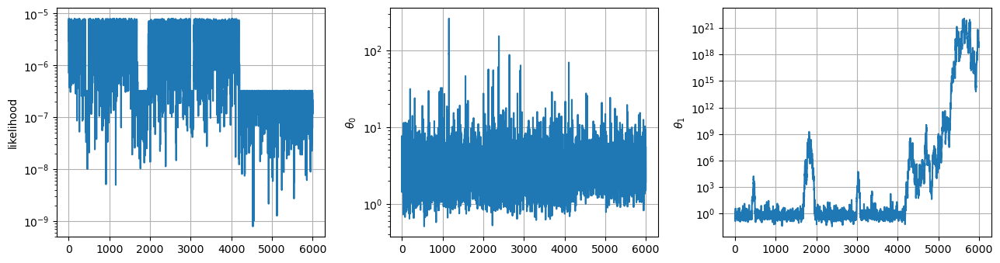

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(13, 3.5))

ax1.plot(L)
ax1.set_ylabel('likelihood')
ax1.set_yscale('log')
ax1.grid()

ax2.plot(samples[:,0])
ax2.set_ylabel(r'$\theta_0$')
ax2.set_yscale('log')
ax2.grid()

ax3.plot(samples[:,1])
ax3.set_ylabel(r'$\theta_1$')
ax3.set_yscale('log')
ax3.grid()

plt.tight_layout()

In [ ]:
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)

# x1 = theta0
# x2 = theta1
x1 = np.linspace(bounds_pars_gp[0][0], bounds_pars_gp[0][1], 50)
x2 = np.linspace(bounds_pars_gp[1][0], bounds_pars_gp[1][1], 50)

xt_plot, ft_plot, y_plot, z = xt[:n], ft[:n], [], []
for i in x2:
  for j in x1:
    y_plot.append(likeli([j,i], xt_plot, ft_plot, matern5)[0])
  z.append(y_plot)
  y_plot = []


fig.add_trace(go.Heatmap(x=x1, y=x2, z=z, type='heatmap', colorscale='YlOrRd'), row=1, col=1)
fig.add_trace(go.Contour(showscale=False, x=x1, y=x2, z=z, colorscale='YlOrRd'), row=1, col=2)
fig.add_trace(go.Scatter(x=samples_x, y=samples_y, mode='markers'), row=1, col=2)
fig.update_layout(title_text = "$Likelihood \;\; p(y | \{x_n\}^N_{n=1}; \u0398, \u03bd, m)$",
                  yaxis_range=[bounds_pars_gp[1][0],bounds_pars_gp[1][1]], xaxis_range=[bounds_pars_gp[0][0],bounds_pars_gp[0][1]])
fig.update_xaxes(title_text = "\u03980")
fig.update_yaxes(title_text = "\u03981", row=1, col=1)
fig.show(renderer="colab")

[Text(0, 0, '0.00'),
 Text(0, 5, '0.13'),
 Text(0, 10, '0.25'),
 Text(0, 15, '0.38'),
 Text(0, 20, '0.50'),
 Text(0, 25, '0.63'),
 Text(0, 30, '0.75'),
 Text(0, 35, '0.88'),
 Text(0, 40, '1.00')]

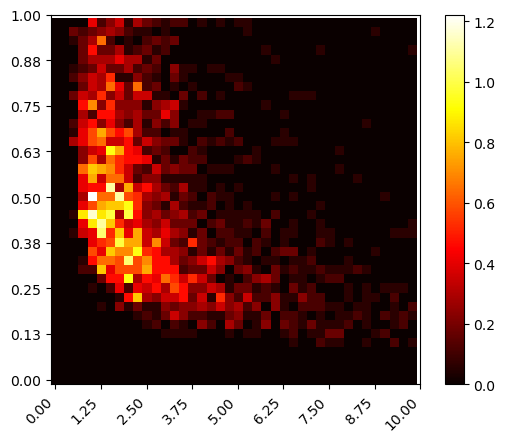

In [ ]:
hist_vals, bin_x, bin_y = np.histogram2d(samples_x, samples_y, bins=40, range=bounds_pars_gp, density=True)

fig, ax = plt.subplots()
im = ax.imshow(hist_vals.T, origin='lower', cmap='hot')
cbar = fig.colorbar(im, ax=ax)

tick_step = 5
ax.set_xticks(np.arange(len(bin_x), step=tick_step))
ax.set_xticklabels(['{:.2f}'.format(edge) for edge in bin_x[::tick_step]], rotation=45, ha='right')
ax.set_yticks(np.arange(len(bin_y), step=tick_step))
ax.set_yticklabels(['{:.2f}'.format(edge) for edge in bin_y[::tick_step]])

In [ ]:
area_bin = (bin_x[1]-bin_x[0])*(bin_y[1]-bin_y[0])

sum_hist_vals = 0                                                       # check if the histogram is normalized
for i in range(hist_vals.shape[0]):
  for j in range(hist_vals.shape[1]):
    sum_hist_vals += hist_vals[i,j]*area_bin
print(f'Integral over hist = {sum_hist_vals:.3f}')

x1, x2 = np.zeros(len(bin_x)-1), np.zeros(len(bin_x)-1)                 # create x1,x2 which matches the bns of the histogram
for i in range(len(x1)):
  x1[i], x2[i] = (bin_x[i+1]+bin_x[i])/2, (bin_y[i+1]+bin_y[i])/2

y_plot, z = [], []                                                      # compute the likelihood on [x1,x2] points
for i in x1:
  for j in x2:
    y_plot.append(likeli([i,j], xt_plot, ft_plot, matern5)[0])
  z.append(y_plot)
  y_plot = []

sum_likeli_vals = 0                                                     # find the normalization constant of the likelihood (constant = evidence)
for i in range(len(z)):
  for j in range(len(z[i])):
    sum_likeli_vals += z[i][j]
print(f'Integral over likeli = {sum_likeli_vals:.3f}')

sum_likeli_vals_check = 0                                               # check if now the integral is normalized
for i in range(len(z)):
  for j in range(len(z[i])):
    sum_likeli_vals_check += z[i][j]/sum_likeli_vals
print(f'Normalized integral over likeli = {sum_likeli_vals_check:.3f}')

Integral over hist = 1.000
Integral over likeli = 0.003
Normalized integral over likeli = 1.000


In [ ]:
KL_div = 0
for i in range(hist_vals.shape[0]):
  for j in range(hist_vals.shape[1]):
    KL_div += hist_vals[i,j]*area_bin * np.log2((hist_vals[i,j]*area_bin + 1e-16) / (z[i][j]/sum_likeli_vals + 1e-16))

print(f'KL divergence = {KL_div:.3f}')

KL divergence = 0.550


Convergence study

In [ ]:
# if this function gives an error, try changing the value of max_lag
cs, A_g, means, stds, ers, EIs = convergence_study([8.3], n, samples, K1s, As, mu_maxs, xt, ft, max_lag=400)

Mean = 0.06754833022005778
std = 0.07323130599582935

Length cs = 13
Ag = 1.790


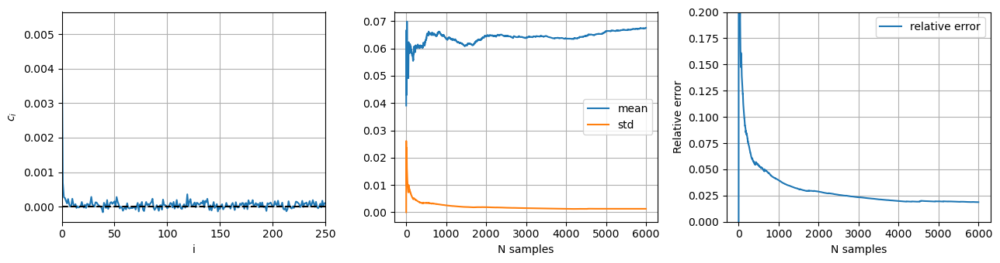

In [ ]:
plot_convergence_study(cs, A_g, means, stds, ers, limx_cs=[0,250], limy_ers=[0,0.2])

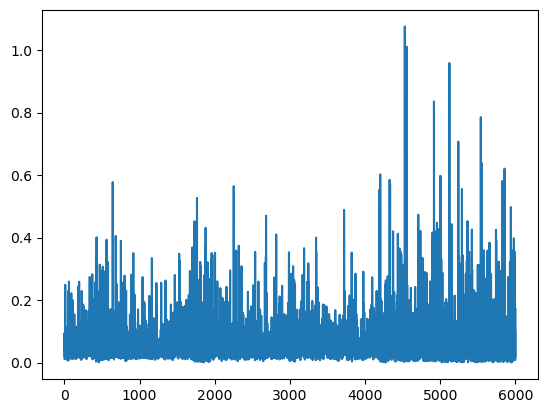

In [ ]:
plt.plot(EIs)

### 3D test

It is needed to run a BO on some problem to run this test (it is ok to run section '1D test')

In [ ]:
num_samples = int(6000)

#sigma = [1.2, 0.02, 0.3]
sigma = [1.4, 0.04, 0.5]
bounds_pars_gp=[(0,10),(0,0.2),(0.02,1)]
dim = len(bounds_pars_gp)
n = 8

start = time()
K1s, As, mu_maxs, samples, L, N_acc, N_rej = metropolis_hastings(xt[:n], ft[:n], matern5, likeli, sigma, num_samples, bounds_pars_gp, thinning=15, print_iters=1e4)
end = time()
print(f'Execution time = {end-start:.3f}')
samples_x, samples_y, samples_z = zip(*samples)

Iter = 10000, 567
Iter = 20000, 1234
Iter = 30000, 1900
Iter = 40000, 2567
Iter = 50000, 3234
Iter = 60000, 3900
Iter = 70000, 4567
Iter = 80000, 5234
Iter = 90000, 5900
Execution time = 116.283


In [ ]:
print(N_acc)
print(N_rej)
print(N_acc+N_rej)
print(N_acc/(N_acc+N_rej))

12042
79444
91486
0.13162669698095883


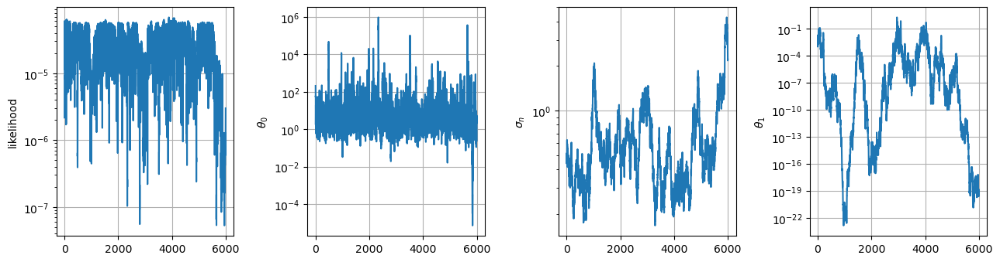

In [ ]:
fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(13, 3.5))

ax1.plot(L)
ax1.set_ylabel('likelihood')
ax1.set_yscale('log')
ax1.grid()

ax2.plot(samples[:,0])
ax2.set_ylabel(r'$\theta_0$')
ax2.set_yscale('log')
ax2.grid()

ax3.plot(samples[:,1])
ax3.set_ylabel(r'$\sigma_n$')
ax3.set_yscale('log')
ax3.grid()

ax4.plot(samples[:,2])
ax4.set_ylabel(r'$\theta_1$')
ax4.set_yscale('log')
ax4.grid()

plt.tight_layout()

In [ ]:
hist_vals, bins = np.histogramdd(np.array([samples_x, samples_y, samples_z]).T, bins=25, range=bounds_pars_gp, density=True)

In [ ]:
area_bin = (bins[0][1]-bins[0][0])*(bins[1][1]-bins[1][0])*(bins[2][1]-bins[2][0])

sum_hist_vals = 0                                                       # check if the histogram is normalized
for i in range(hist_vals.shape[0]):
  for j in range(hist_vals.shape[1]):
    for k in range(hist_vals.shape[2]):
      sum_hist_vals += hist_vals[i,j,k]*area_bin
print(f'Integral over hist = {sum_hist_vals:.3f}')

x1, x2, x3 = np.zeros(len(bins[0])-1), np.zeros(len(bins[0])-1), np.zeros(len(bins[0])-1)  # create x1,x2 which matches the bns of the histogram
for i in range(len(x1)):
  x1[i], x2[i], x3[i] = (bins[0][i+1]+bins[0][i])/2, (bins[1][i+1]+bins[1][i])/2, (bins[2][i+1]+bins[2][i])/2

y_plot, y_plot2, z = [], [], []                                                      # compute the likelihood on [x1,x2] points
for i in x1:
  for j in x2:
    for k in x3:
      y_plot.append(likeli([i,j,k], xt_plot, ft_plot, matern5)[0])
    y_plot2.append(y_plot)
    y_plot = []
  z.append(y_plot2)
  y_plot2 = []

sum_likeli_vals = 0                                                     # find the normalization constant of the likelihood (constant = evidence)
for i in range(len(z)):
  for j in range(len(z[i])):
    for k in range(len(z[i][j])):
      sum_likeli_vals += z[i][j][k]
print(f'Integral over likeli = {sum_likeli_vals:.3f}')

sum_likeli_vals_check = 0                                               # check if now the integral is normalized
for i in range(len(z)):
  for j in range(len(z[i])):
    for k in range(len(z[i][j])):
      sum_likeli_vals_check += z[i][j][k]/sum_likeli_vals
print(f'Normalized integral over likeli = {sum_likeli_vals_check:.3f}')

Integral over hist = 1.000
Integral over likeli = 0.038
Normalized integral over likeli = 1.000


In [ ]:
KL_div = 0
for i in range(hist_vals.shape[0]):
  for j in range(hist_vals.shape[1]):
    for k in range(hist_vals.shape[2]):
      KL_div += hist_vals[i,j,k]*area_bin * np.log2((hist_vals[i,j,k]*area_bin + 1e-16) / (z[i][j][k]/sum_likeli_vals + 1e-16))

print(f'KL divergence = {KL_div:.3e}')

KL divergence = 9.291e+00


Study on convergence

In [ ]:
# if this function gives an error, try changing the value of max_lag
cs, A_g, means, stds, ers, EIs = convergence_study([8.3], n, samples, K1s, As, mu_maxs, xt, ft, max_lag=1000)

Mean = 0.1046253519944818
std = 0.0335583502748579

Length cs = 364
Ag = 179.510


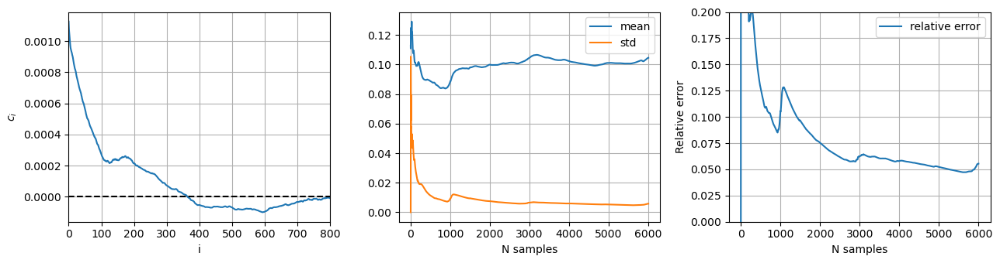

In [ ]:
plot_convergence_study(cs, A_g, means, stds, ers, limx_cs=[0,800], limy_ers=[0,0.2])

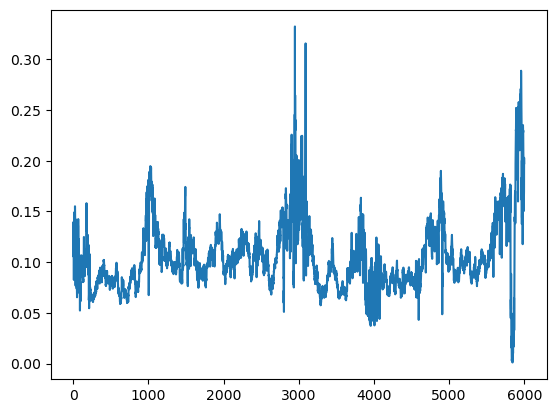

In [ ]:
plt.plot(EIs)

### 4D test

It is needed to run a BO on some problem to run this test (it is ok to run section '2D test' above)

In [ ]:
num_samples = int(600)

sigma = [1.3, 0.01, 0.3, 0.3]
bounds_pars_gp=[(2500,22500),(0.001,2),(1e-4,0.01),(1e-4,0.01)]
n = 12

start = time()
K1s, As, mu_maxs, samples, L, N_acc, N_rej = metropolis_hastings(xt[:n], ft[:n], matern5, likeli, sigma, num_samples, bounds_pars_gp, thinning=15, print_iters=1e4)
end = time()
print(f'Execution time = {end-start:.3f}')

Execution time = 38.840


In [ ]:
print(N_acc)
print(N_rej)
print(N_acc+N_rej)
print(N_acc/(N_acc+N_rej))

1097
8024
9121
0.1202719000109637


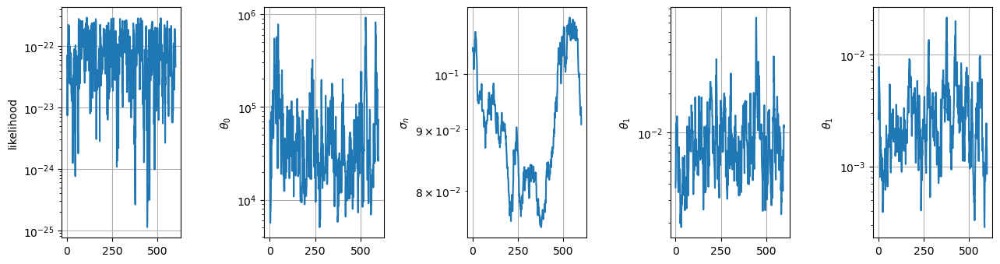

In [ ]:
fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1, 5, figsize=(13, 3.5))

ax1.plot(L)
ax1.set_ylabel('likelihood')
ax1.set_yscale('log')
ax1.grid()

ax2.plot(samples[:,0])
ax2.set_ylabel(r'$\theta_0$')
ax2.set_yscale('log')
ax2.grid()

ax3.plot(samples[:,1])
ax3.set_ylabel(r'$\sigma_n$')
ax3.set_yscale('log')
ax3.grid()

ax4.plot(samples[:,2])
ax4.set_ylabel(r'$\theta_1$')
ax4.set_yscale('log')
ax4.grid()

ax5.plot(samples[:,3])
ax5.set_ylabel(r'$\theta_1$')
ax5.set_yscale('log')
ax5.grid()

plt.tight_layout()

Convergence study

In [ ]:
cs, A_g, means, stds, ers, EIs = convergence_study([-2.5, 9], n, samples, K1s, As, mu_maxs, xt, ft, max_lag=500)

Mean = 5.069556893980547
std = 4.042354681400013

Length cs = 15
Ag = 5.933


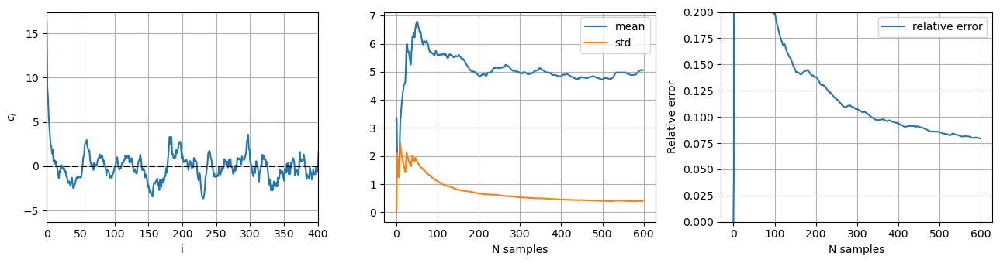

In [ ]:
plot_convergence_study(cs, A_g, means, stds, ers, limx_cs=[0,400], limy_ers=[0,0.2])

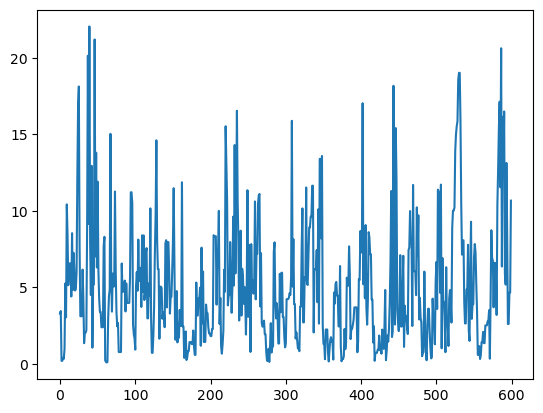

In [ ]:
plt.plot(EIs)

#### Plots for presentation

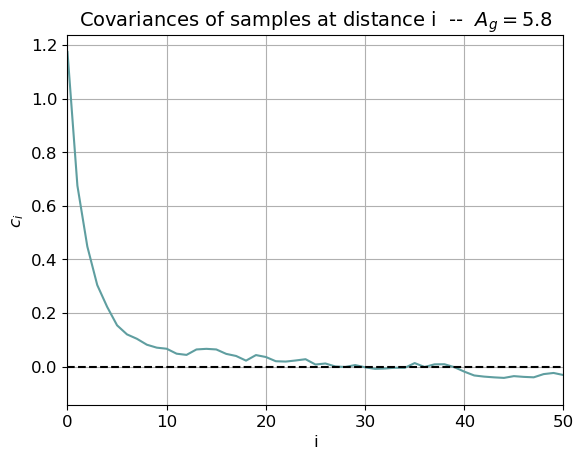

In [ ]:
plt.plot(cs,'cadetblue')
plt.hlines(0,0,300,'k',linestyle='dashed')
plt.xlim([0,50])
plt.title(r'Covariances of samples at distance i  --  $A_g=5.8$', fontsize=14)
plt.xlabel('i', fontsize=12)
plt.ylabel(r'$c_i$', fontsize=12)
plt.tick_params(labelsize=12)
plt.grid()

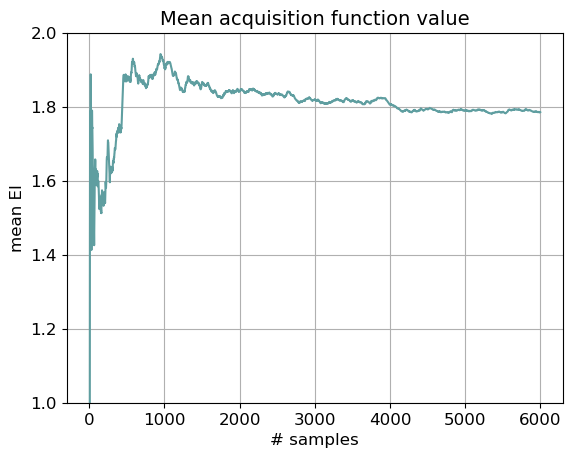

In [ ]:
plt.plot(means,'cadetblue')
plt.title('Mean acquisition function value', fontsize=14)
plt.xlabel('# samples', fontsize=12)
plt.ylabel('mean EI', fontsize=12)
plt.tick_params(labelsize=12)
plt.ylim([1,2])
plt.grid()

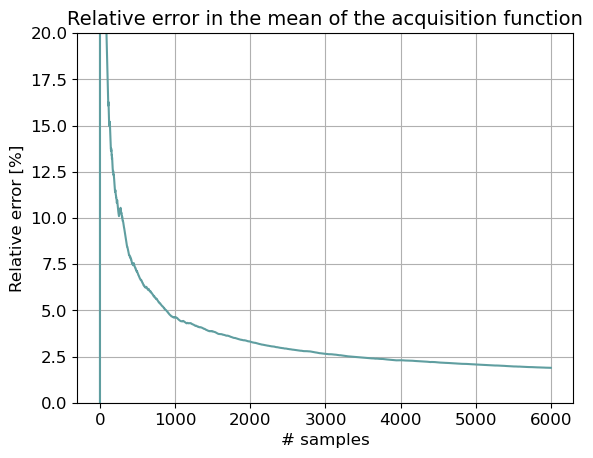

In [ ]:
plt.plot(np.array(ers)*100,'cadetblue')
plt.title('Relative error in the mean of the acquisition function', fontsize=14)
plt.xlabel('# samples', fontsize=12)
plt.ylabel('Relative error [%]', fontsize=12)
plt.tick_params(labelsize=12)
plt.ylim([0,20])
plt.grid()

In [ ]:
 import csv

 with open('C:\\Users\\andre\\Desktop\\UniPD\\Information theory and inference\\Project\\Plots\\Study_metropolis_data.csv', 'w', newline='') as file:
  writer = csv.writer(file)
  writer.writerow(['c_i', 'mean', 'relative error'])
  for i in range(len(means)):
    if i<len(cs):
      writer.writerow([cs[i], means[i], ers[i]])
    else:
      writer.writerow([0, means[i], ers[i]])

### Analysis of rejection sampling efficiency

In [ ]:
def rejection_sampling_2(target_func, mu, sig, num_samples=1):
    samples = []
    dim = len(mu)
    bounds = [(mu[i]-sig[i]**2-3*sig[i],mu[i]-sig[i]**2+3*sig[i]) for i in range(dim)]
    mins, maxs = zip(*bounds)
    iter, N_acc = 0, 0

    while len(samples) < num_samples:
      x = np.random.uniform(mins, maxs, size=dim)  # Genera un campione casuale nel range [-1, 1] per ogni dimensione
      y = np.random.uniform(0, 1)  # Genera un numero casuale tra 0 e 1 come valore di accettazione

      # Calcola il valore della funzione target nel punto campionato
      target_value = target_func(x, mu, sig)

      # Verifica se il campione è accettato o rifiutato
      if y < target_value :
        samples.append(x)
        N_acc += 1
      iter += 1

    if num_samples==1:
      samples = samples[0]
    return samples, N_acc, iter-N_acc

In [ ]:
print(np.random.uniform(-5,5))
print(np.random.uniform(0,5))

-2.4232444350195914
2.437533411401735


In [ ]:
test_mean, test_sigma = [3.8, -0.1, -4.2, -4.2, -2.4], [2.4, 0.27, 2.6, 1.2, 2.4]
n_dim = 1

acc_rate_list, t_list = [], []
for i in range(10):
  start_t = time()
  samples_rejs, N_acc, N_rej = rejection_sampling_2(proposal_dist, test_mean[:n_dim], test_sigma[:n_dim], 10000)
  end_t = time()
  acc_rate_list.append(N_acc/(N_acc+N_rej))
  t_list.append(end_t-start_t)

print(f'Mean acceptance rate = {np.mean(acc_rate_list)}')
print(f'Error acceptance rate = {np.std(acc_rate_list)/(np.sqrt(len(acc_rate_list)))}\n')
print(f'Mean computation time = {np.mean(t_list)}')
print(f'Error computation time = {np.std(t_list)/(np.sqrt(len(t_list)))}')

Mean acceptance rate = 0.4176491622302166
Error acceptance rate = 0.0010304844492211665

Mean computation time = 1.017930769920349
Error computation time = 0.04239667927970917


In [ ]:
n_dim = [1, 2, 3, 4, 5]

mean_acc_rate = [0.417649, 0.173035, 0.0721823, 0.0301431, 0.0125203]
error_acc_rate = [0.001030, 0.000564, 0.0002248, 0.0000920, 0.0000433]

mean_comp_time = [1.01793, 2.38555 , 5.77700, 13.9823, 33.9834]
error_comp_time = [0.04240, 0.02596 , 0.03349, 0.1592, 0.1689]

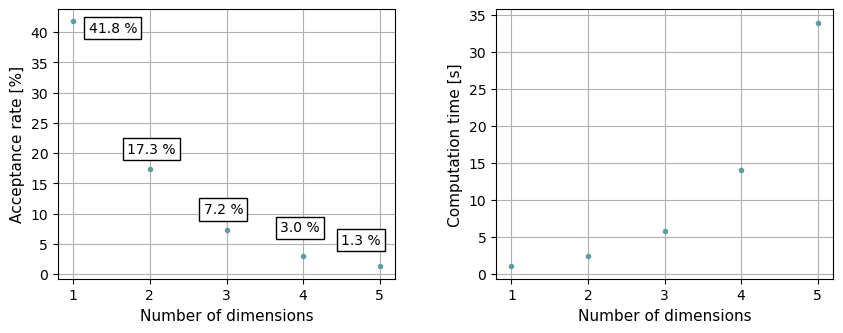

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3.5))
plt.subplots_adjust(wspace=0.3)

ax1.errorbar(n_dim, np.array(mean_acc_rate)*100, error_acc_rate, fmt='.', color='cadetblue')
ax1.set_xlabel('Number of dimensions', fontsize=11)
ax1.set_ylabel('Acceptance rate [%]', fontsize=11)
ax1.text(1.2, 40, '41.8 %', bbox={'boxstyle':'square', 'color':'white', 'ec':'black'})
ax1.text(1.7, 20, '17.3 %', bbox={'boxstyle':'square', 'color':'white', 'ec':'black'})
ax1.text(2.7, 10, '7.2 %', bbox={'boxstyle':'square', 'color':'white', 'ec':'black'})
ax1.text(3.7, 7,'3.0 %', bbox={'boxstyle':'square', 'color':'white', 'ec':'black'})
ax1.text(4.5, 5,'1.3 %', bbox={'boxstyle':'square', 'color':'white', 'ec':'black'})
ax1.grid()

ax2.errorbar(n_dim, mean_comp_time, error_comp_time, fmt='.', color='cadetblue')
ax2.set_xlabel('Number of dimensions', fontsize=11)
ax2.set_ylabel('Computation time [s]', fontsize=11)
#ax2.set_yticks([i*10 for i in range(10)])
ax2.grid()